#EDA + ARIMA

In [93]:
import datetime

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pandas as pd
import dateutil.easter as ea

import statsmodels.formula.api as smf
from statsmodels.tsa.seasonal import MSTL
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import Holt

from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error

from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

import xgboost as xgb
import multiprocessing


## Temperature Dataset

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_temp_nsw = pd.read_csv('/content/drive/MyDrive/NSW/temperature_nsw.csv')
data_temp_nsw['DATETIME'] = pd.to_datetime(data_temp_nsw['DATETIME'])
data_temp_nsw.tail()

,LOCATION,DATETIME,TEMPERATURE
220321,Bankstown,2021-03-17 23:00:00,19.1
220322,Bankstown,2021-03-17 23:20:00,19.0
220323,Bankstown,2021-03-17 23:30:00,18.8
220324,Bankstown,2021-03-17 23:34:00,18.8
220325,Bankstown,2021-03-18 00:00:00,18.6



### Data Preprocessing
#### Checking for Missing Values


In [4]:
# pd.Series(mask).value_counts()

In [5]:
# miss_value = data_temp_nsw.isnull().sum()
# print(miss_value)


It can be seen that in the temperature dataset there are no missing values from each column
#### Checking Data Duplication and Abnormal Data
The data was checked because this data was obtained once every 30 minutes every day. Therefore, if there is data whose timestamp is not a multiple of 30 minutes, the data row will be deleted and a duplicate check will also be carried out on this.


In [6]:
# Convert DATETIME column to datetime type
data_temp_nsw['DATETIME'] = pd.to_datetime(data_temp_nsw['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Calculate the time difference between data entries
data_temp_nsw['TIME_DIFF'] = data_temp_nsw['DATETIME'].diff().dt.total_seconds()

# Determine the threshold for the time difference that is considered abnormal
threshold = 1800  # 1800 seconds = 30 minutes

# Check if the time difference exceeds the threshold or is not a multiple of 30 minutes
abnormal_indices = data_temp_nsw[(data_temp_nsw['TIME_DIFF'] != threshold) | (data_temp_nsw['DATETIME'].dt.minute % 30 != 0)].index

# Update timestamp values and abnormal temperature values
for idx in abnormal_indices:
    if idx > 0 and data_temp_nsw.loc[idx, 'DATETIME'].minute % 30 != 0:
        prev_timestamp = data_temp_nsw.loc[idx-1, 'DATETIME']  # Previous timestamp
        prev_temperature = data_temp_nsw.loc[idx-1, 'TEMPERATURE']  # Previous temperature value
        data_temp_nsw.loc[idx, 'DATETIME'] = prev_timestamp
        data_temp_nsw.loc[idx, 'TEMPERATURE'] = prev_temperature

# Delete the TIME_DIFF column because it is no longer needed
data_temp_nsw = data_temp_nsw.drop(columns=['TIME_DIFF'])

# Remove duplicate data based on LOCATION, DATETIME, and TEMPERATURE columns
temp_clean = data_temp_nsw.drop_duplicates(subset=['LOCATION', 'DATETIME', 'TEMPERATURE'])
temp_clean.tail()



,LOCATION,DATETIME,TEMPERATURE
220319,Bankstown,2021-03-17 22:00:00,19.7
220320,Bankstown,2021-03-17 22:30:00,19.5
220321,Bankstown,2021-03-17 23:00:00,19.1
220323,Bankstown,2021-03-17 23:30:00,18.8
220325,Bankstown,2021-03-18 00:00:00,18.6


In [7]:
# Checking the amount of data before and after deleting duplicate data

#Data Before Deletion
print("Data Before Deletion:", len(data_temp_nsw))

# Data After Deleting
print("Data After Deleting:", len(temp_clean))

Data Before Deletion: 220326
Data After Deleting: 195934


It can be seen from the comparison results above that 24,392 rows of data have been deleted due to the possibility of human error and data duplication.


### Descriptive statistics

In [8]:
stat_desk_temp = data_temp_nsw.describe()
stat_desk2_temp = temp_clean.describe()
combined_desk = pd.concat([stat_desk_temp, stat_desk2_temp], axis=1)
combined_desk.columns = ['Before Preprocessing', "After Preprocessing"]
print(combined_desk)

       Before Preprocessing  After Preprocessing
count         220326.000000        195934.000000
mean              17.428332            17.530868
std                5.856431             5.884349
min               -1.300000            -1.300000
25%               13.400000            13.500000
50%               17.700000            17.900000
75%               21.400000            21.500000
max               44.700000            44.700000



The descriptive statistical results above were obtained, which were divided into before preprocessing and after preprocessing. The striking difference between before and after preprocessing is the amount of data, where before preprocessing it was 220,326 and after preprocessing it was only 195,934 where around 24,392 rows of data were deleted. Apart from that, the average temperature data before preprocessing was 17.42 and after preprocessing it was 17.53. The minimum and maximum values before and after preprocessing remain the same, namely -1.3 and 44.7.
### Data Visualization


Box plot of temperature data

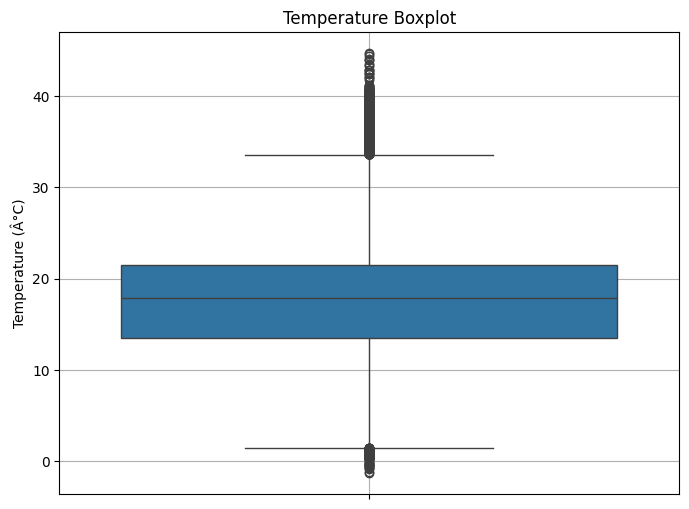

In [9]:
plt.figure(figsize=(8, 6))
sns.boxplot(y='TEMPERATURE', data=temp_clean)
plt.ylabel('Temperature (Â°C)')
plt.title('Temperature Boxplot')
plt.grid(True)
plt.show()

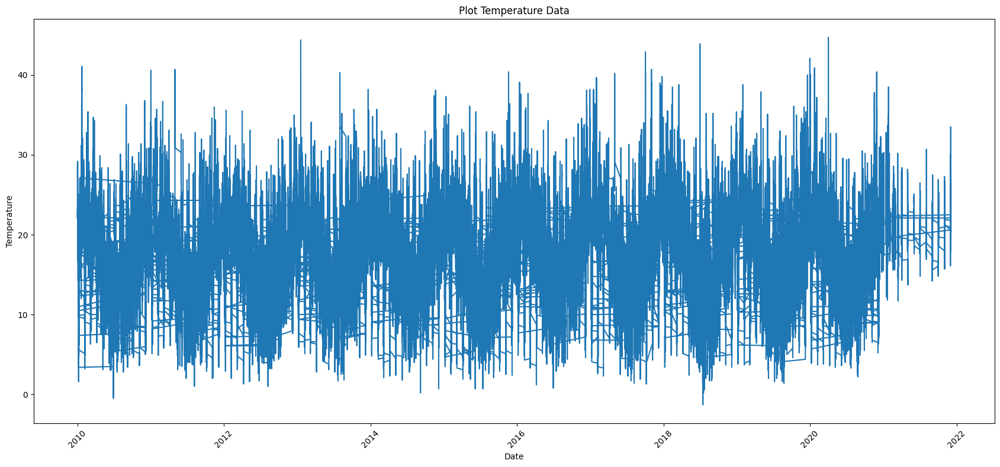

In [10]:
plt.figure(figsize=(17, 8))
plt.plot(temp_clean['DATETIME'], temp_clean['TEMPERATURE'])#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Plot Temperature Data')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()


Obtained above, plot the temperature data from January 2010 to December 2021 in the form of data per half hour. Visually, it looks like there is seasonality in the data, where fluctuations tend to recur in each period. Next, to make it clearer, a plot is made over an annual period.
#### 2010 Temperature Plot


<ipython-input-11-f6b02f2b7acc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


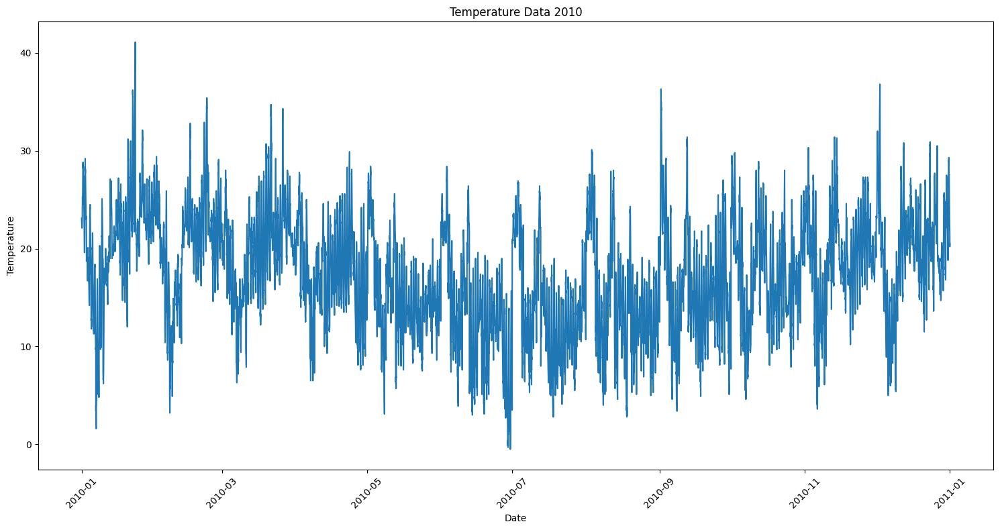

In [11]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2010
data_2010 = temp_clean[(temp_clean['DATETIME'].dt.year == 2010)]
data_2010 = data_2010.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2010['DATETIME'], data_2010['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2010')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

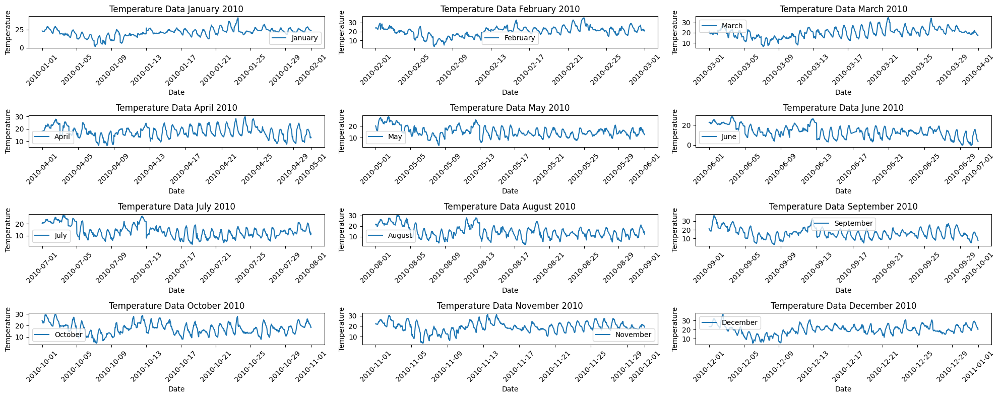

In [12]:
# Filter data only for 2010
data_2010 = temp_clean[temp_clean['DATETIME'].dt.year == 2010]


# Separate data by month
january_data = data_2010[data_2010['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2010[data_2010['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2010[data_2010['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2010[data_2010['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2010[data_2010['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2010[data_2010['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2010[data_2010['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2010[data_2010['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2010[data_2010['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2010[data_2010['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2010[data_2010['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2010[data_2010['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2010')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2010')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2010')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-13-cbe42de57595>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


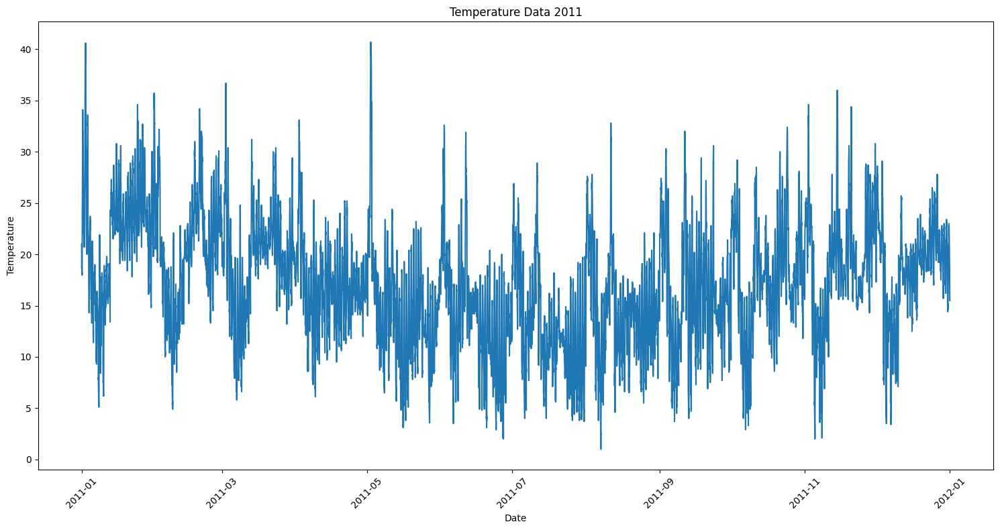

In [13]:
#### Plot Temperatur 2011
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')
# Data filter only for  January 2010
data_2011 = temp_clean[(temp_clean['DATETIME'].dt.year == 2011)]
data_2011 = data_2011.sort_values(by='DATETIME')
# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2011['DATETIME'], data_2011['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2011')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

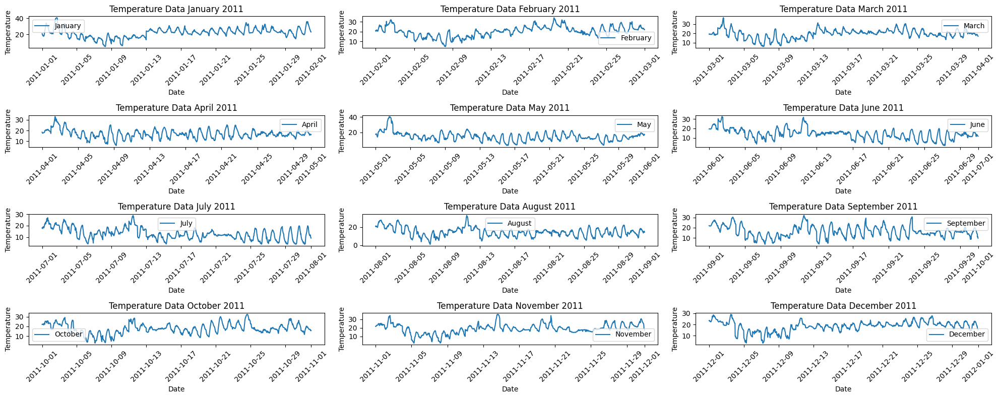

In [14]:
# Filter data only for 2011
data_2011 = temp_clean[temp_clean['DATETIME'].dt.year == 2011]


# Separate data by month
january_data = data_2011[data_2011['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2011[data_2011['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2011[data_2011['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2011[data_2011['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2011[data_2011['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2011[data_2011['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2011[data_2011['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2011[data_2011['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2011[data_2011['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2011[data_2011['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2011[data_2011['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2011[data_2011['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2011')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2011')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2011')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-15-787d9182e68b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


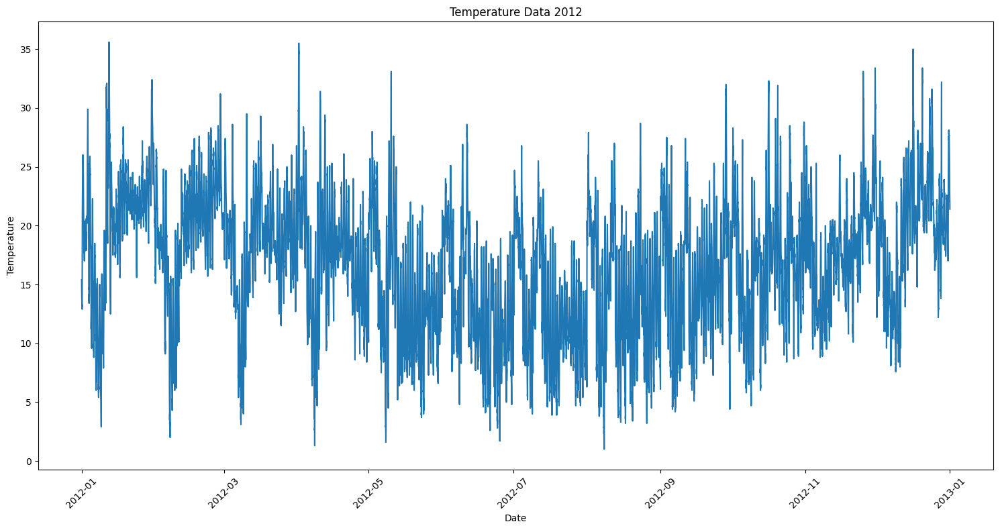

In [15]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2012
data_2012 = temp_clean[(temp_clean['DATETIME'].dt.year == 2012)]
data_2012 = data_2012.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2012['DATETIME'], data_2012['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2012')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

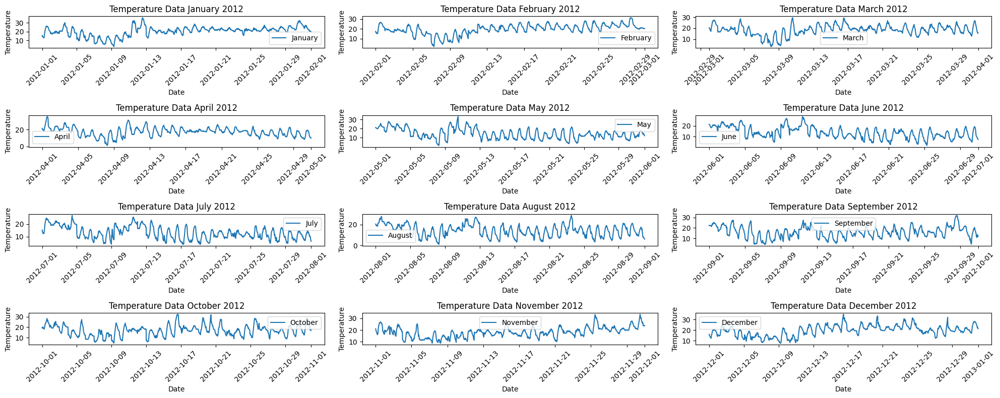

In [16]:


# Filter data only for 2012
data_2012 = temp_clean[temp_clean['DATETIME'].dt.year == 2012]


# Separate data by month
january_data = data_2012[data_2012['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2012[data_2012['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2012[data_2012['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2012[data_2012['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2012[data_2012['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2012[data_2012['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2012[data_2012['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2012[data_2012['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2012[data_2012['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2012[data_2012['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2012[data_2012['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2012[data_2012['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2012')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2012')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2012')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-17-1b8c1fe86b7c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


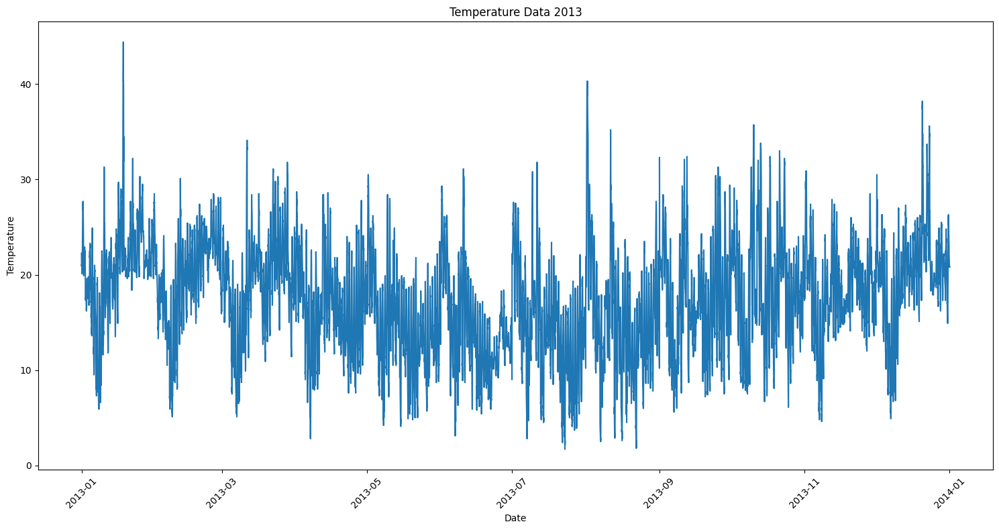

In [17]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2013
data_2013 = temp_clean[(temp_clean['DATETIME'].dt.year == 2013)]
data_2013 = data_2013.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2013['DATETIME'], data_2013['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2013')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

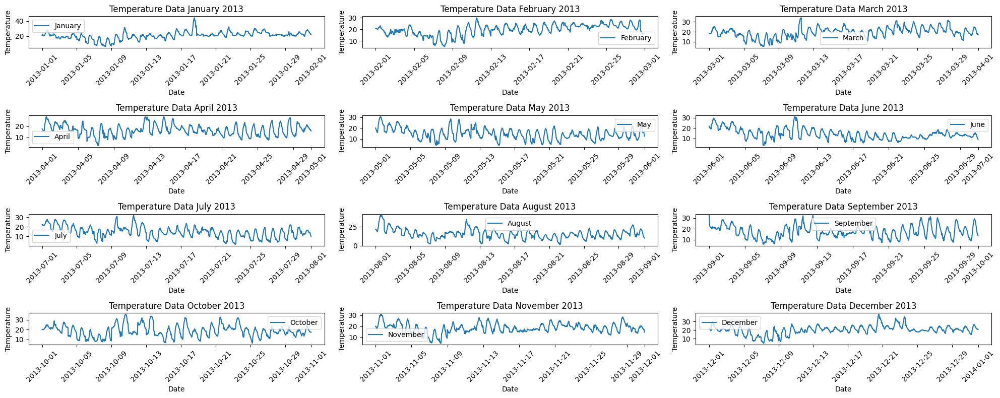

In [18]:
# Filter data only for 2013
data_2013 = temp_clean[temp_clean['DATETIME'].dt.year == 2013]


# Separate data by month
january_data = data_2013[data_2013['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2013[data_2013['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2013[data_2013['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2013[data_2013['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2013[data_2013['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2013[data_2013['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2013[data_2013['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2013[data_2013['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2013[data_2013['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2013[data_2013['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2013[data_2013['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2013[data_2013['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2013')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2013')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2013')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-19-33a3bbc9cd05>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


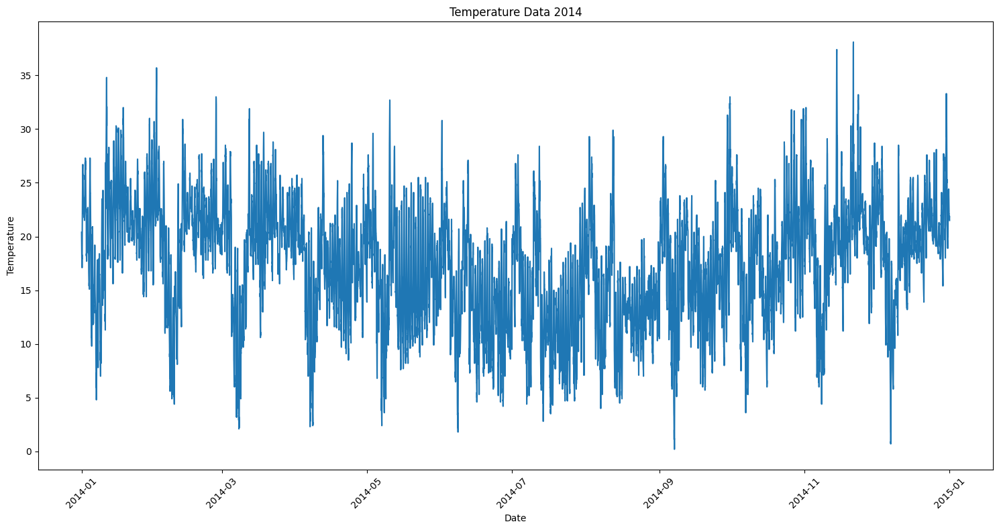

In [19]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2014
data_2014 = temp_clean[(temp_clean['DATETIME'].dt.year == 2014)]
data_2014 = data_2014.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2014['DATETIME'], data_2014['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2014')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

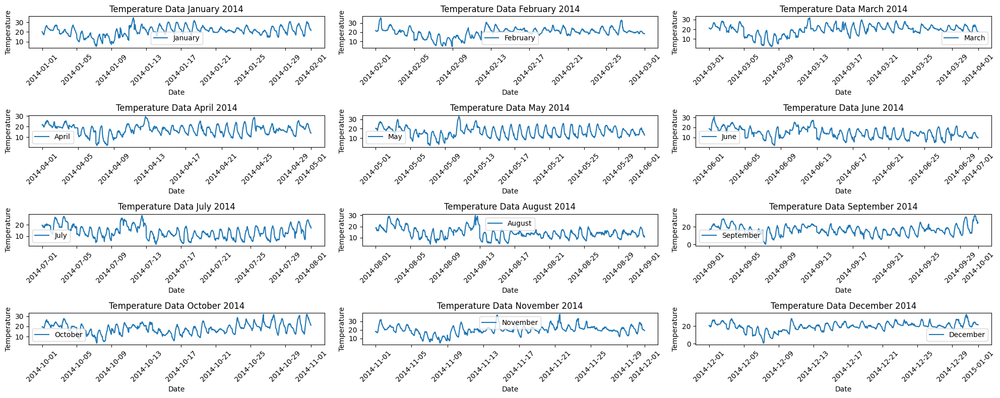

In [20]:


# Filter data only for 2014
data_2014 = temp_clean[temp_clean['DATETIME'].dt.year == 2014]


# Separate data by month
january_data = data_2014[data_2014['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2014[data_2014['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2014[data_2014['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2014[data_2014['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2014[data_2014['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2014[data_2014['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2014[data_2014['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2014[data_2014['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2014[data_2014['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2014[data_2014['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2014[data_2014['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2014[data_2014['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2014')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2014')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2014')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-21-17069547471c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


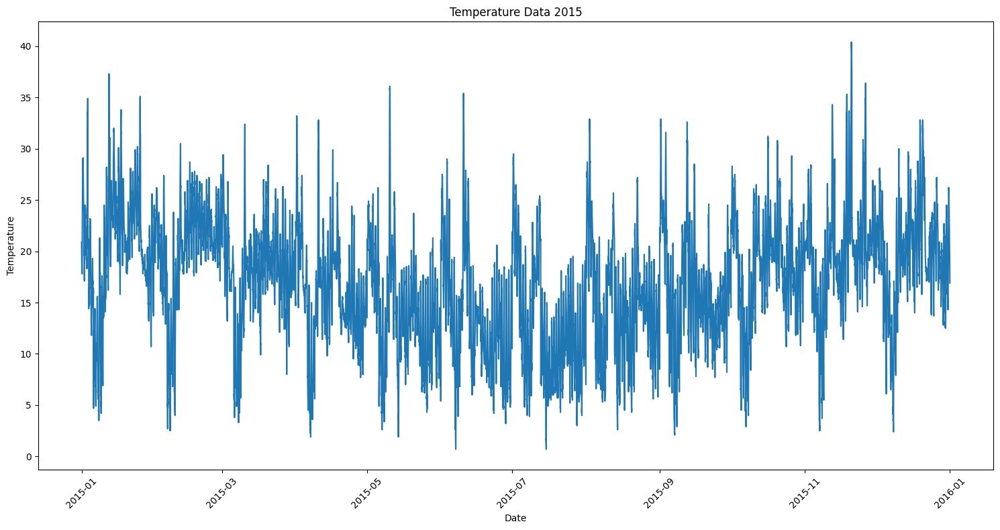

In [21]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2015
data_2015 = temp_clean[(temp_clean['DATETIME'].dt.year == 2015)]
data_2015 = data_2015.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2015['DATETIME'], data_2015['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2015')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

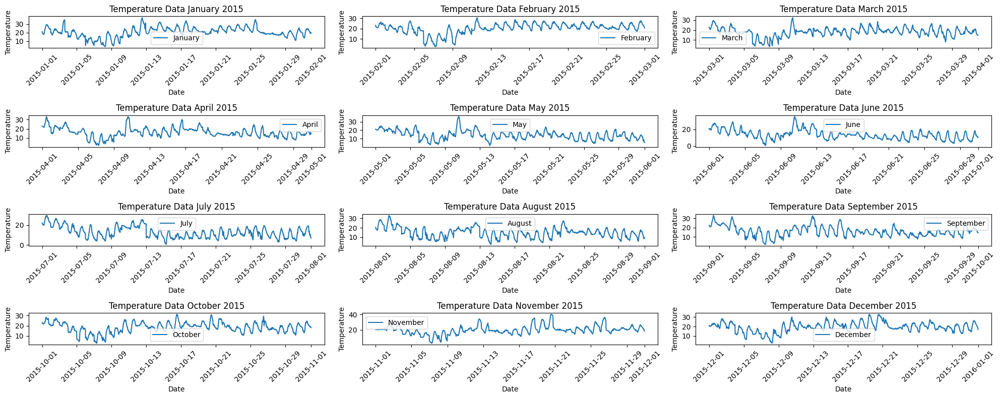

In [22]:


# Filter data only for 2015
data_2015 = temp_clean[temp_clean['DATETIME'].dt.year == 2015]


# Separate data by month
january_data = data_2015[data_2015['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2015[data_2015['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2015[data_2015['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2015[data_2015['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2015[data_2015['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2015[data_2015['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2015[data_2015['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2015[data_2015['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2015[data_2015['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2015[data_2015['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2015[data_2015['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2015[data_2015['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2015')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2015')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2015')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-23-23720c4d07d6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


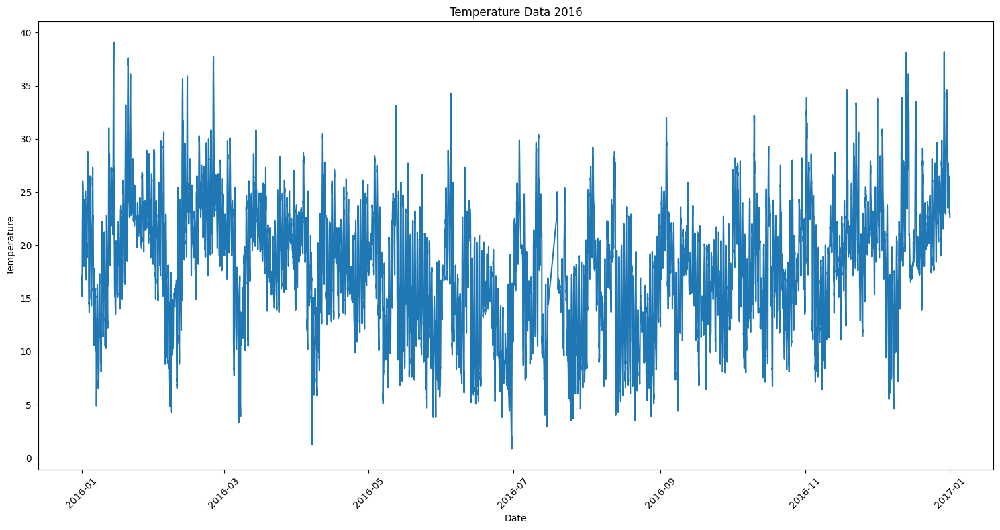

In [23]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2016
data_2016 = temp_clean[(temp_clean['DATETIME'].dt.year == 2016)]
data_2016 = data_2016.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2016['DATETIME'], data_2016['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2016')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

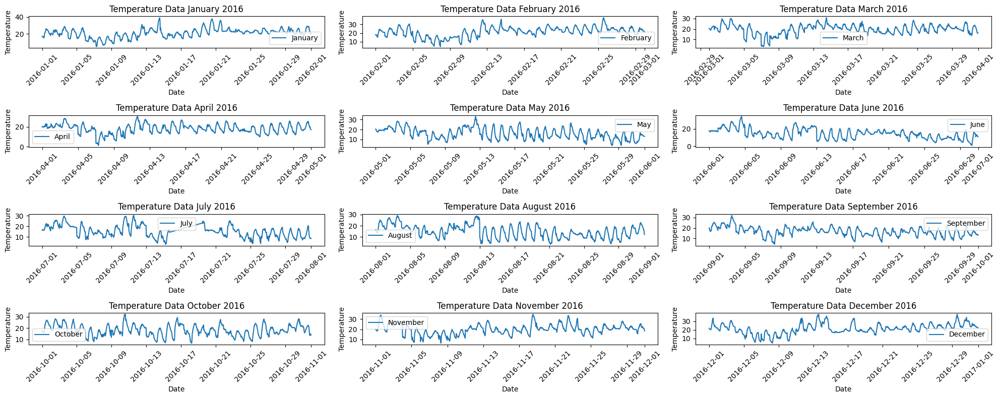

In [24]:


# Filter data only for 2016
data_2016 = temp_clean[temp_clean['DATETIME'].dt.year == 2016]


# Separate data by month
january_data = data_2016[data_2016['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2016[data_2016['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2016[data_2016['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2016[data_2016['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2016[data_2016['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2016[data_2016['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2016[data_2016['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2016[data_2016['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2016[data_2016['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2016[data_2016['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2016[data_2016['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2016[data_2016['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2016')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2016')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2016')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-25-74f11458cdf5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


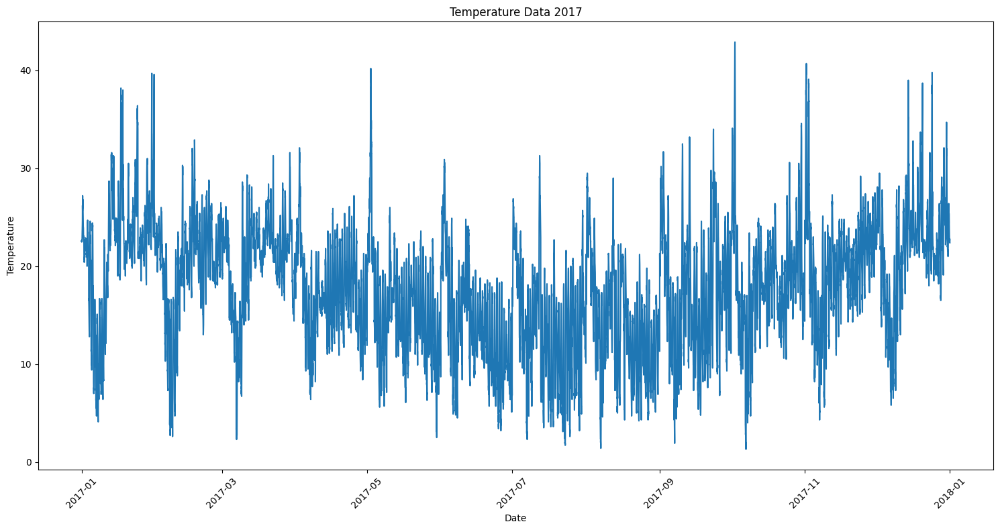

In [25]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2017
data_2017 = temp_clean[(temp_clean['DATETIME'].dt.year == 2017)]
data_2017 = data_2017.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2017['DATETIME'], data_2017['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2017')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()


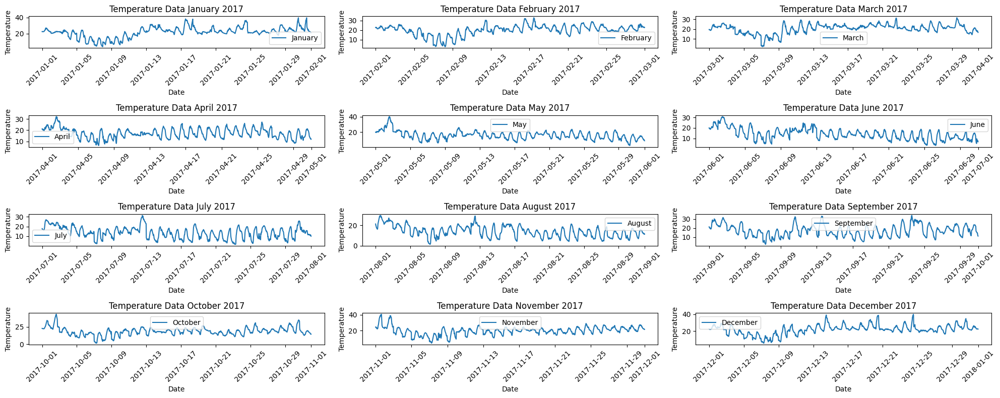

In [26]:

# Filter data only for 2017
data_2017 = temp_clean[temp_clean['DATETIME'].dt.year == 2017]


# Separate data by month
january_data = data_2017[data_2017['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2017[data_2017['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2017[data_2017['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2017[data_2017['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2017[data_2017['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2017[data_2017['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2017[data_2017['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2017[data_2017['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2017[data_2017['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2017[data_2017['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2017[data_2017['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2017[data_2017['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2017')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2017')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2017')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-27-aecba41cd79b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


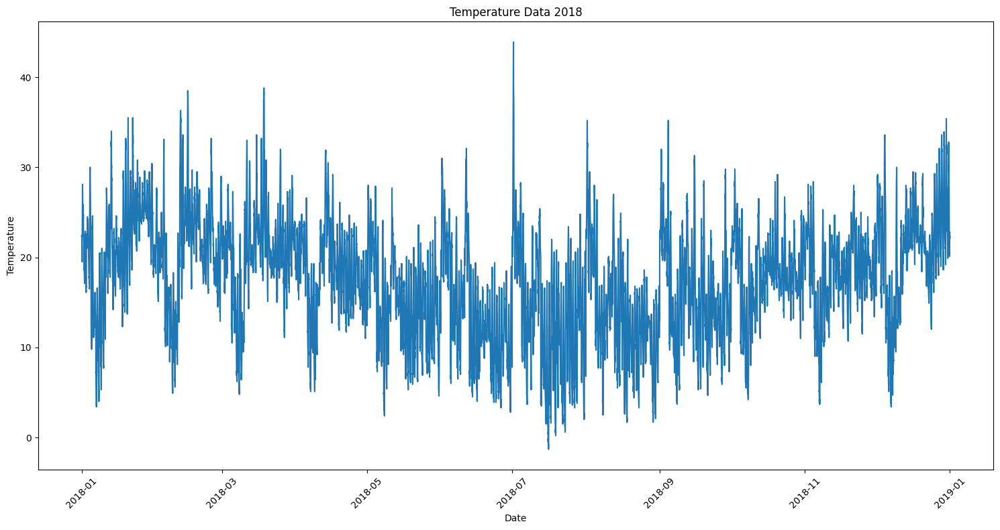

In [27]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2018
data_2018 = temp_clean[(temp_clean['DATETIME'].dt.year == 2018)]
data_2018 = data_2018.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2018['DATETIME'], data_2018['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2018')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

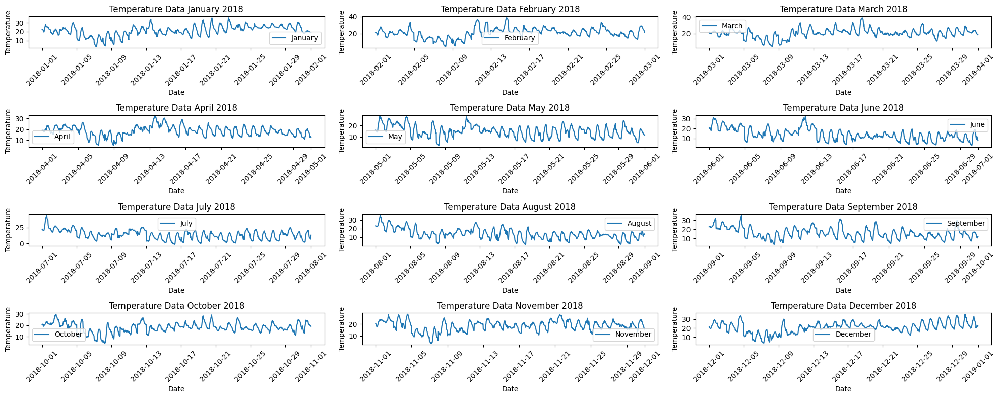

In [28]:


# Filter data only for 2018
data_2018 = temp_clean[temp_clean['DATETIME'].dt.year == 2018]


# Separate data by month
january_data = data_2018[data_2018['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2018[data_2018['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2018[data_2018['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2018[data_2018['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2018[data_2018['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2018[data_2018['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2018[data_2018['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2018[data_2018['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2018[data_2018['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2018[data_2018['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2018[data_2018['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2018[data_2018['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2018')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2018')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2018')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-29-1351098a118b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


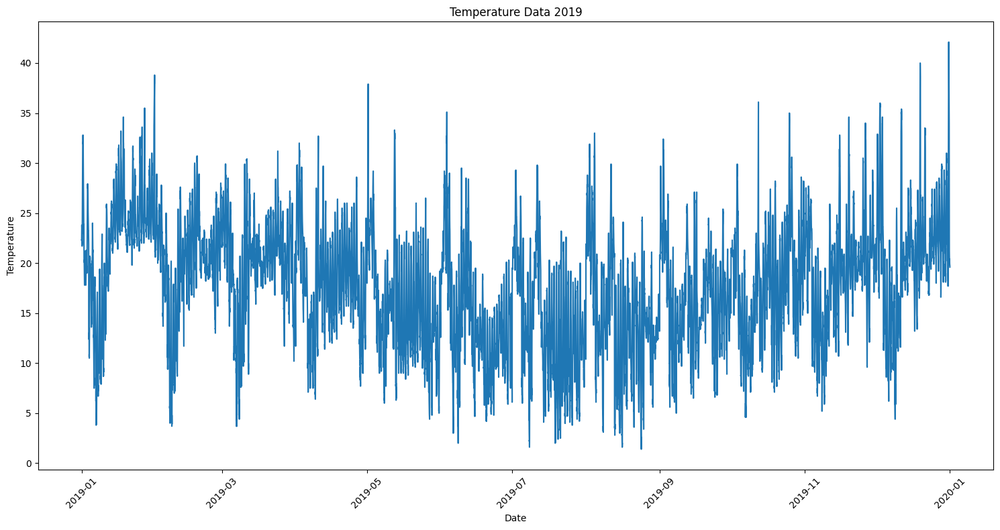

In [29]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2019
data_2019 = temp_clean[(temp_clean['DATETIME'].dt.year == 2019)]
data_2019 = data_2019.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2019['DATETIME'], data_2019['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2019')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()


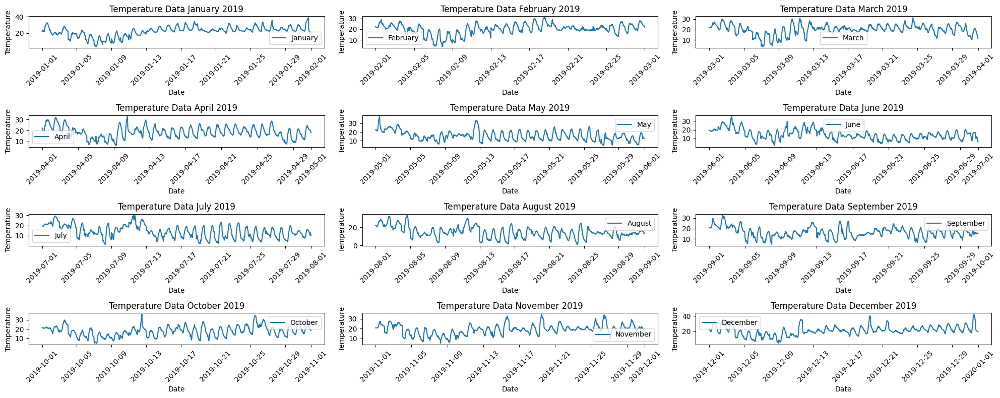

In [30]:

# Filter data only for 2019
data_2019 = temp_clean[temp_clean['DATETIME'].dt.year == 2019]


# Separate data by month
january_data = data_2019[data_2019['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2019[data_2019['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2019[data_2019['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2019[data_2019['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2019[data_2019['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2019[data_2019['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2019[data_2019['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2019[data_2019['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2019[data_2019['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2019[data_2019['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2019[data_2019['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2019[data_2019['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2019')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2019')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2019')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-31-270e85325377>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


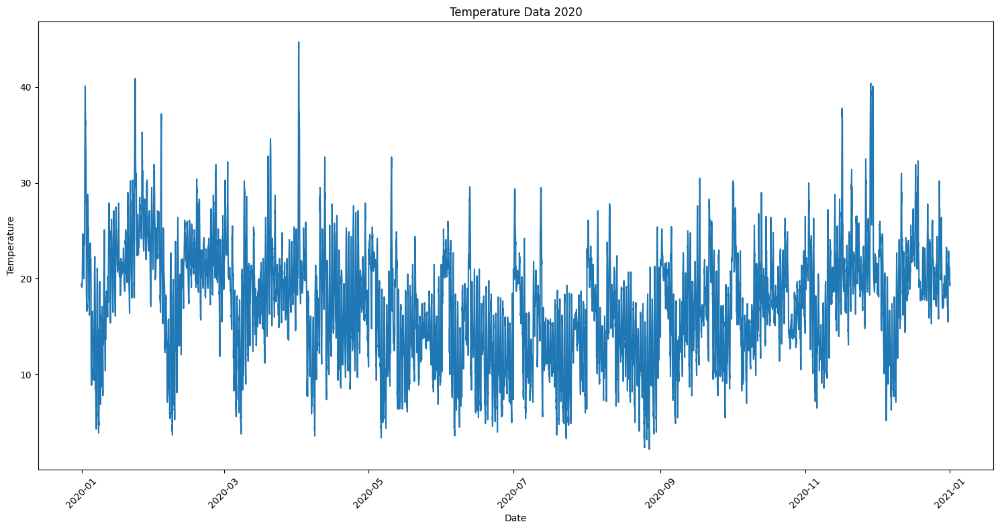

In [31]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2020
data_2020 = temp_clean[(temp_clean['DATETIME'].dt.year == 2020)]
data_2020 = data_2020.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2020['DATETIME'], data_2020['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2020')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()

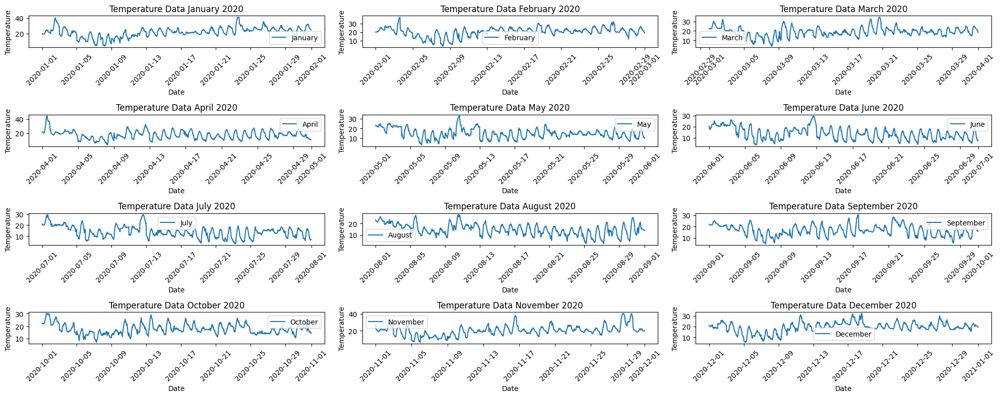

In [32]:


# Filter data only for 2020
data_2020 = temp_clean[temp_clean['DATETIME'].dt.year == 2020]


# Separate data by month
january_data = data_2020[data_2020['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2020[data_2020['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2020[data_2020['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2020[data_2020['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2020[data_2020['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2020[data_2020['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2020[data_2020['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2020[data_2020['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2020[data_2020['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2020[data_2020['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2020[data_2020['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2020[data_2020['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2020')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2020')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2020')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-33-f2c2ed4fcae6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


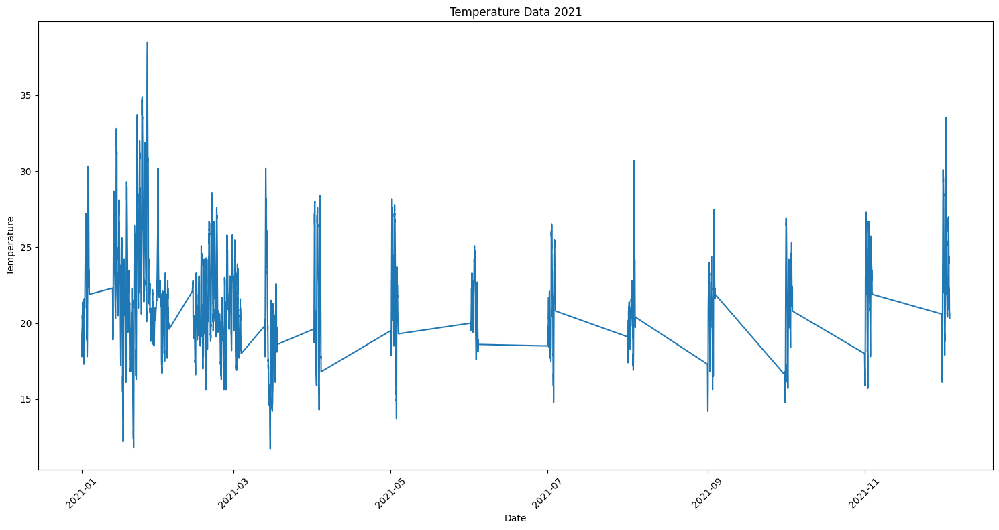

In [33]:
# Convert DATETIME column to datetime type
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for January 2021
data_2021 = temp_clean[(temp_clean['DATETIME'].dt.year == 2021)]
data_2021 = data_2021.sort_values(by='DATETIME')

# Time series plots
plt.figure(figsize=(15, 8))
plt.plot(data_2021['DATETIME'], data_2021['TEMPERATURE'])
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data 2021')
plt.xticks(rotation=45)
#plt.grid(True)
plt.tight_layout()
plt.show()


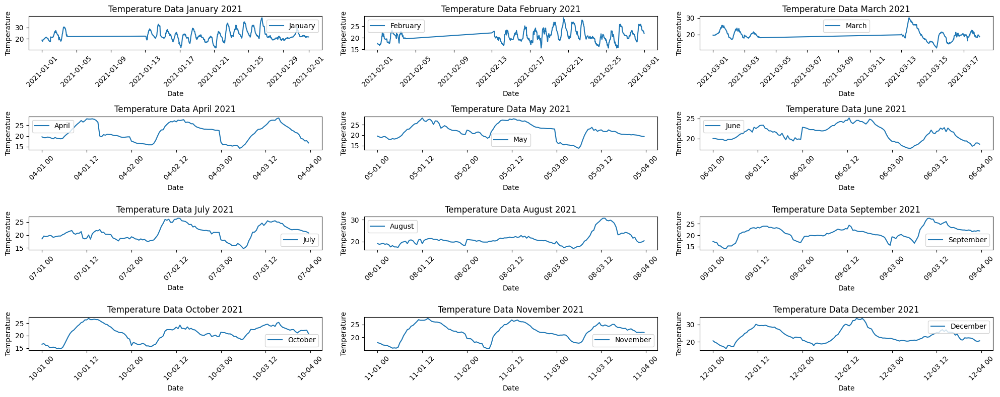

In [34]:

# Filter data only for 2021
data_2021 = temp_clean[temp_clean['DATETIME'].dt.year == 2021]


# Separate data by month
january_data = data_2021[data_2021['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2021[data_2021['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2021[data_2021['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2021[data_2021['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2021[data_2021['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2021[data_2021['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2021[data_2021['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2021[data_2021['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2021[data_2021['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2021[data_2021['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2021[data_2021['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2021[data_2021['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')


# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TEMPERATURE'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data January 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TEMPERATURE'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data February 2021')
plt.legend()
plt.xticks(rotation=45)

#plot March data
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TEMPERATURE'], label='March')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data March 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TEMPERATURE'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data April 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TEMPERATURE'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data May 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TEMPERATURE'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data June 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot data July
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TEMPERATURE'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data July 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot data August
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TEMPERATURE'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data August 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot data September
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TEMPERATURE'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data September 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot data October
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TEMPERATURE'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data October 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot data November
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TEMPERATURE'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data November 2021')
plt.legend()
plt.xticks(rotation=45)

#Plot data December
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TEMPERATURE'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Data December 2021')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [35]:

"""We will try to change the data we have into 3 parts,
- Daily average
- Weekly average
- Monthly average`
"""
temp_clean.isnull().sum()

LOCATION       0
DATETIME       0
TEMPERATURE    0
dtype: int64

In [36]:
temp_clean

,LOCATION,DATETIME,TEMPERATURE
0,Bankstown,2010-01-01 00:00:00,23.1
2,Bankstown,2010-01-01 00:30:00,22.9
4,Bankstown,2010-01-01 01:00:00,22.6
5,Bankstown,2010-01-01 01:30:00,22.5
6,Bankstown,2010-01-01 02:00:00,22.5
...,...,...,...
220319,Bankstown,2021-03-17 22:00:00,19.7
220320,Bankstown,2021-03-17 22:30:00,19.5
220321,Bankstown,2021-03-17 23:00:00,19.1
220323,Bankstown,2021-03-17 23:30:00,18.8


Convert DATETIME column to datetime type

In [37]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')
temp_clean.tail()

<ipython-input-37-d68c5723c6aa>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


,LOCATION,DATETIME,TEMPERATURE
220319,Bankstown,2021-03-17 22:00:00,19.7
220320,Bankstown,2021-03-17 22:30:00,19.5
220321,Bankstown,2021-03-17 23:00:00,19.1
220323,Bankstown,2021-03-17 23:30:00,18.8
220325,Bankstown,2021-03-18 00:00:00,18.6


Save the daily_avg_temp_var variable into a CSV file

In [38]:
temp_clean.to_csv('TEMP_CLEAN_PLIS.csv', header=True, index=True)

Calculate the average temperature per day using GroupBy and Mean

In [39]:
daily_avg_temp = temp_clean.groupby(temp_clean['DATETIME'].dt.date)['TEMPERATURE'].mean()
daily_avg_temp

DATETIME
2010-01-01    25.185417
2010-01-02    24.461702
2010-01-03    18.737500
2010-01-04    19.191489
2010-01-05    15.912821
                ...    
2021-11-02    21.970833
2021-11-03    22.175000
2021-12-01    23.850000
2021-12-02    24.556250
2021-12-03    22.650000
Name: TEMPERATURE, Length: 4092, dtype: float64

Convert DATETIME column to datetime type

In [40]:
temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

<ipython-input-40-be72cd73cac7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_clean['DATETIME'] = pd.to_datetime(temp_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')


Calculate the average temperature per day

In [41]:
monthly_avg_temp = temp_clean.resample('M', on='DATETIME').mean()

<ipython-input-41-51d15d439ba5>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_avg_temp = temp_clean.resample('M', on='DATETIME').mean()


In [42]:
print(monthly_avg_temp)

            TEMPERATURE
DATETIME               
2010-01-31    20.868008
2010-02-28    20.218907
2010-03-31    19.828286
2010-04-30    17.593856
2010-05-31    15.323485
...                 ...
2021-08-31    21.104167
2021-09-30    20.999306
2021-10-31    21.084722
2021-11-30    22.118056
2021-12-31    23.685417

[144 rows x 1 columns]



## Demand Dataset
### Import Package


In [43]:

### Input Data

from google.colab import drive
drive.mount('/content/drive')
data_demand_nsw = pd.read_csv('/content/drive/MyDrive/NSW/totaldemand_nsw.csv')
data_demand_nsw['DATETIME'] = pd.to_datetime(data_demand_nsw['DATETIME'])
data_demand_nsw.head()
## Data Preprocessing

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,DATETIME,TOTALDEMAND,REGIONID
0,2010-01-01 00:00:00,8038.00,NSW1
1,2010-01-01 00:30:00,7809.31,NSW1
2,2010-01-01 01:00:00,7483.69,NSW1
3,2010-01-01 01:30:00,7117.23,NSW1
4,2010-01-01 02:00:00,6812.03,NSW1


## Check Missing Values

In [44]:
miss_value = data_demand_nsw.isnull().sum()
print(miss_value)

DATETIME       0
TOTALDEMAND    0
REGIONID       0
dtype: int64





it can be seen that in the demand dataset there are no missing values from each column

## Duplicate & Abnormal data check
The data was checked because this data was obtained once every 30 minutes every day. Therefore, if there is data whose timestamp is not a multiple of 30 minutes, the data row will be deleted and a duplicate check will also be carried out on this.


In [45]:
df2 = pd.DataFrame(data_demand_nsw)
df2

,DATETIME,TOTALDEMAND,REGIONID
0,2010-01-01 00:00:00,8038.00,NSW1
1,2010-01-01 00:30:00,7809.31,NSW1
2,2010-01-01 01:00:00,7483.69,NSW1
3,2010-01-01 01:30:00,7117.23,NSW1
4,2010-01-01 02:00:00,6812.03,NSW1
...,...,...,...
196508,2021-03-17 22:00:00,7419.77,NSW1
196509,2021-03-17 22:30:00,7417.91,NSW1
196510,2021-03-17 23:00:00,7287.32,NSW1
196511,2021-03-17 23:30:00,7172.39,NSW1


In [46]:
import pandas as pd

Convert DATETIME column to datetime type

In [47]:
data_demand_nsw['DATETIME'] = pd.to_datetime(data_demand_nsw['DATETIME'], format='%Y-%m-%d %H:%M:%S')

Calculate the time difference between data entries

In [48]:
data_demand_nsw['TIME_DIFF'] = data_demand_nsw['DATETIME'].diff().dt.total_seconds()

Determine the threshold for the time difference that is considered abnormal

In [49]:
threshold = 1800  # 1800 seconds = 30 minutes

Check if the time difference exceeds the threshold or is not a multiple of 30 minutes

In [50]:
abnormal_indices = data_demand_nsw[(data_demand_nsw['TIME_DIFF'] != threshold) | (data_demand_nsw['DATETIME'].dt.minute % 30 != 0)].index

Update timestamp values and abnormal demand values

In [51]:
for idx in abnormal_indices:
    if idx > 0 and data_demand_nsw.loc[idx, 'DATETIME'].minute % 30 != 0:
        prev_timestamp = data_demand_nsw.loc[idx-1, 'DATETIME']  # Previous timestamp
        prev_demand = data_demand_nsw.loc[idx-1, 'TEMPERATURE']  # Previous demand value
        data_demand_nsw.loc[idx, 'DATETIME'] = prev_timestamp
        data_demand_nsw.loc[idx, 'TEMPERATURE'] = prev_demand

Delete the TIME_DIFF column because it is no longer needed

In [52]:
data_demand_nsw = data_demand_nsw.drop(columns=['TIME_DIFF'])

Remove duplicate data based on LOCATION, DATETIME, and TEMPERATURE columns

In [53]:
demand_clean = data_demand_nsw.drop_duplicates(subset=['TOTALDEMAND', 'DATETIME', 'REGIONID'])
demand_clean.tail()

,DATETIME,TOTALDEMAND,REGIONID
196508,2021-03-17 22:00:00,7419.77,NSW1
196509,2021-03-17 22:30:00,7417.91,NSW1
196510,2021-03-17 23:00:00,7287.32,NSW1
196511,2021-03-17 23:30:00,7172.39,NSW1
196512,2021-03-18 00:00:00,7094.51,NSW1


Checking the amount of data before and after deleting duplicate data

Data Before Deletion

In [54]:
print("Demand Data Before Deletion:", len(data_demand_nsw))

Demand Data Before Deletion: 196513


Data After Deleting

In [55]:
print("Demand Data After Deleting:", len(demand_clean))

Demand Data After Deleting: 196513



It can be seen from the comparison results above, obtained after checking timestamps and duplications, that no rows of data were deleted for the demand dataset.
### Descriptive Analytics


In [56]:
stat_desk_demand = data_demand_nsw.describe()
stat_desk2_demand = demand_clean.describe()
combined_desk_demand = pd.concat([stat_desk_demand, stat_desk2_demand], axis=1)
combined_desk_demand.columns = ['Before Preprocessing', "After Preprocessing"]
print(combined_desk_demand)

       Before Preprocessing  After Preprocessing
count         196513.000000        196513.000000
mean            8113.145859          8113.145859
std             1299.532774          1299.532774
min             5074.630000          5074.630000
25%             7150.070000          7150.070000
50%             8053.230000          8053.230000
75%             8958.550000          8958.550000
max            14579.860000         14579.860000



The descriptive statistical results above were obtained, which were divided into before preprocessing and after preprocessing. There is no difference at all, the amount of data to be analyzed is 196,513 with an average of 8,113,146. The minimum and maximum values â€‹â€‹of this data are 5,074.63 and 14,579.86.
### Data Visualization


Box plot of temperature data

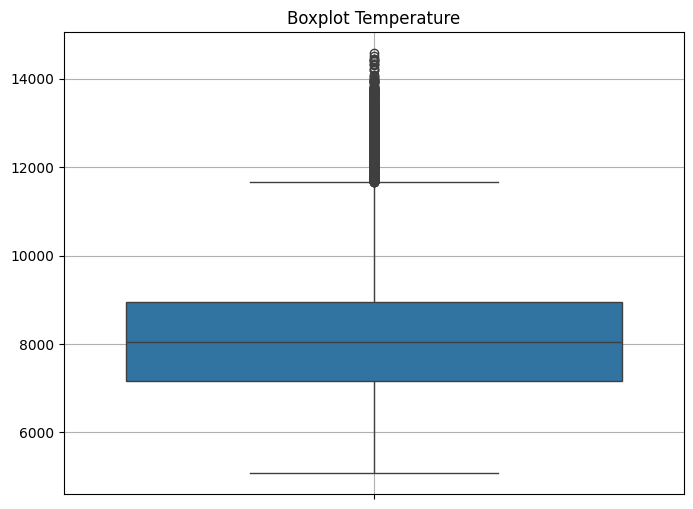

In [57]:
plt.figure(figsize=(8, 6))
sns.boxplot(y='TOTALDEMAND', data=demand_clean)
plt.ylabel('')
plt.title('Boxplot Temperature')
plt.grid(True)
plt.show()

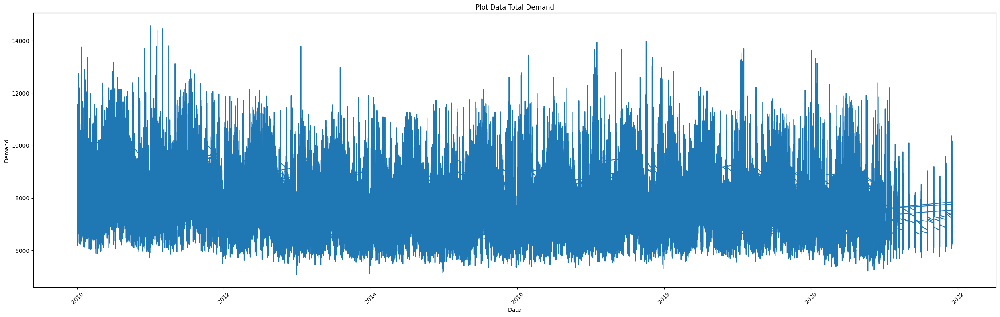

In [58]:
plt.figure(figsize=(25, 8))
plt.plot(demand_clean['DATETIME'], demand_clean['TOTALDEMAND'])#, marker='o')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.title('Plot Data Total Demand')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Obtained above, plot the demand data from January 2010 to December 2021 in the form of data per half hour. Visually, it looks like there is seasonality in the data, where fluctuations tend to recur in each period. Next, to make it clearer, a plot is made over an annual period.


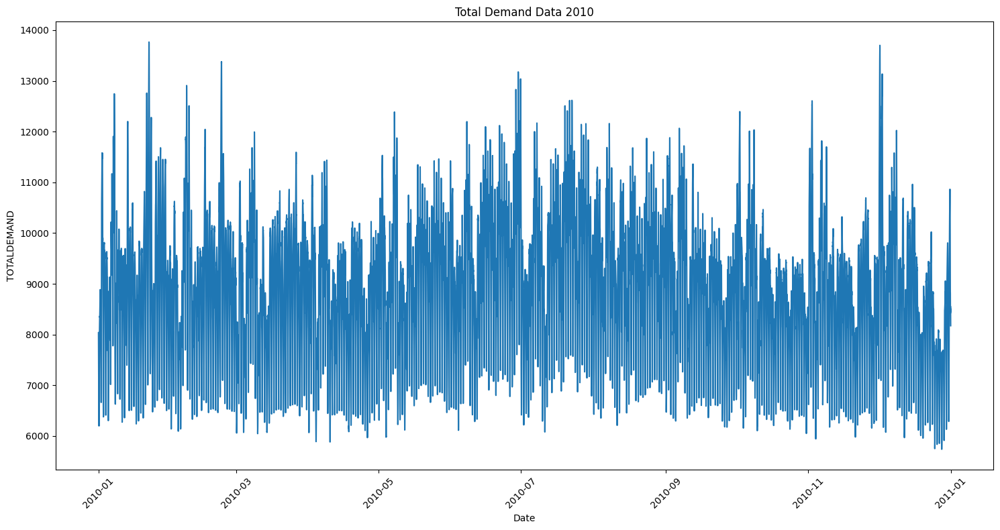

In [59]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2010
data_2010 = demand_clean[(demand_clean['DATETIME'].dt.year == 2010)]
data_2010 = data_2010.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2010['DATETIME'], data_2010['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2010')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()

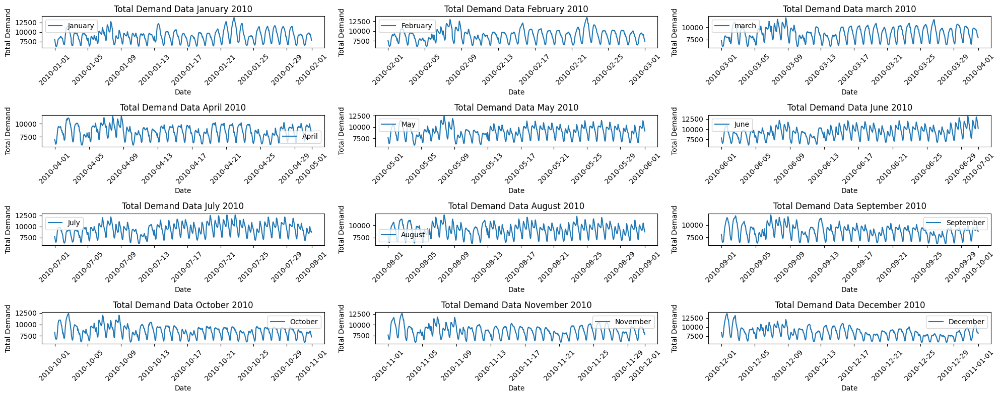

In [60]:
# Data filter only for 2010
data_2010 = demand_clean[demand_clean['DATETIME'].dt.year == 2010]

# Separate data by month
january_data = data_2010[data_2010['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2010[data_2010['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2010[data_2010['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2010[data_2010['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2010[data_2010['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2010[data_2010['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2010[data_2010['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2010[data_2010['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2010[data_2010['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2010[data_2010['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2010[data_2010['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2010[data_2010['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2010')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2010')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2010')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2010')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2010')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

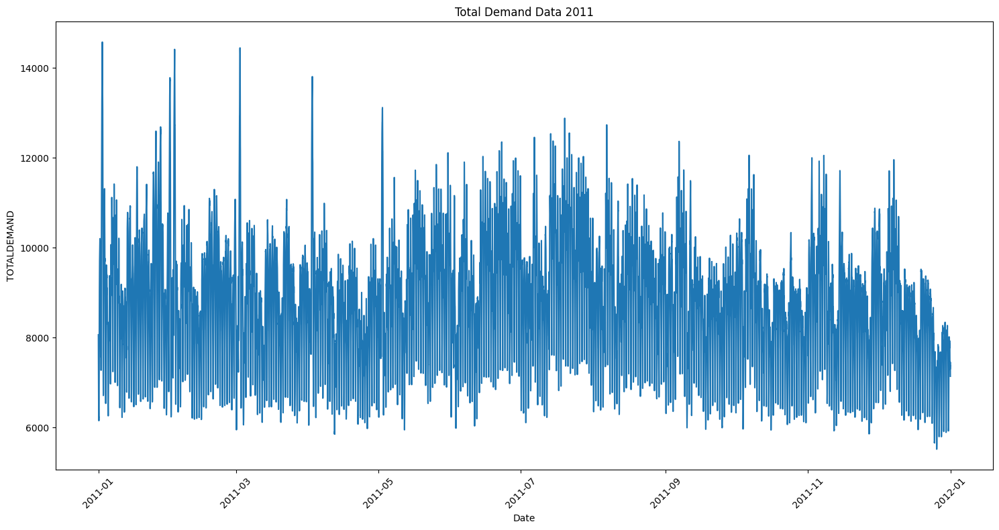

In [61]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2011
data_2011 = demand_clean[(demand_clean['DATETIME'].dt.year == 2011)]
data_2011 = data_2011.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2011['DATETIME'], data_2011['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2011')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()

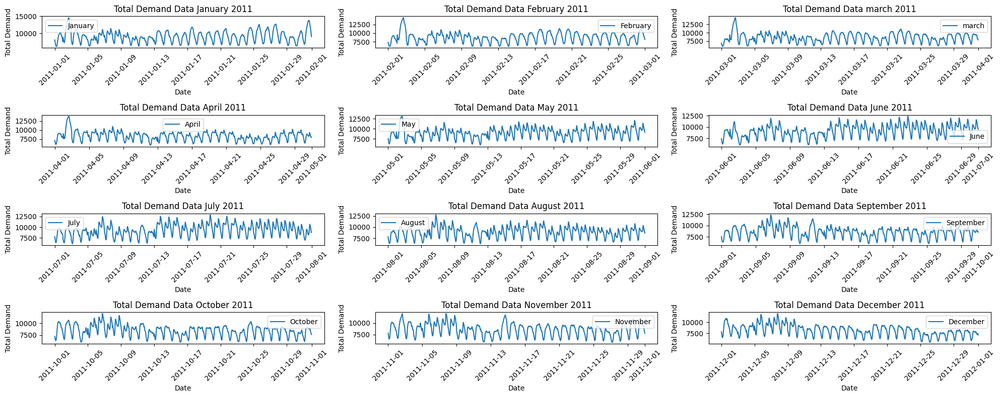

In [62]:


# Data filter only for 2011
data_2011 = demand_clean[demand_clean['DATETIME'].dt.year == 2011]

# Separate data by month
january_data = data_2011[data_2011['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2011[data_2011['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2011[data_2011['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2011[data_2011['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2011[data_2011['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2011[data_2011['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2011[data_2011['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2011[data_2011['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2011[data_2011['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2011[data_2011['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2011[data_2011['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2011[data_2011['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2011')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2011')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2011')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2011')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2011')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

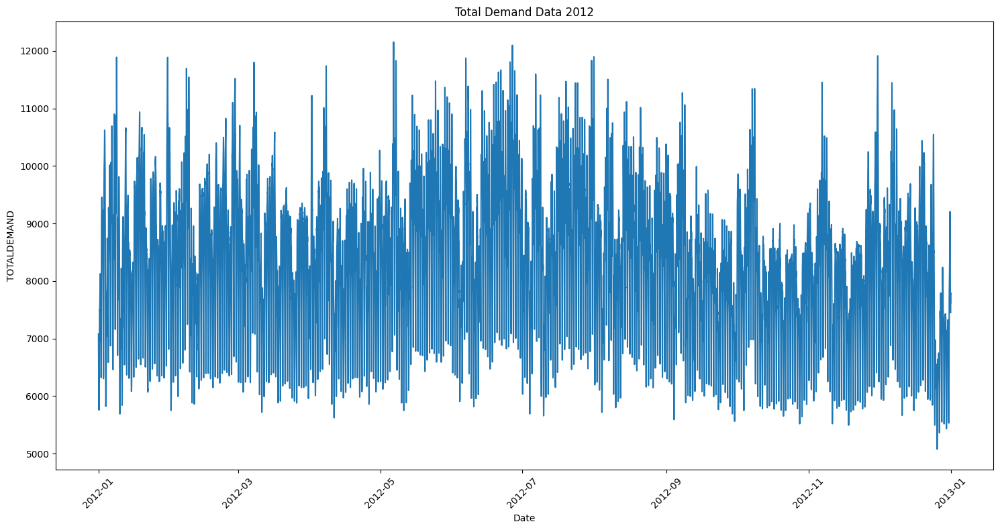

In [63]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2012
data_2012 = demand_clean[(demand_clean['DATETIME'].dt.year == 2012)]
data_2012 = data_2012.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2012['DATETIME'], data_2012['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2012')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


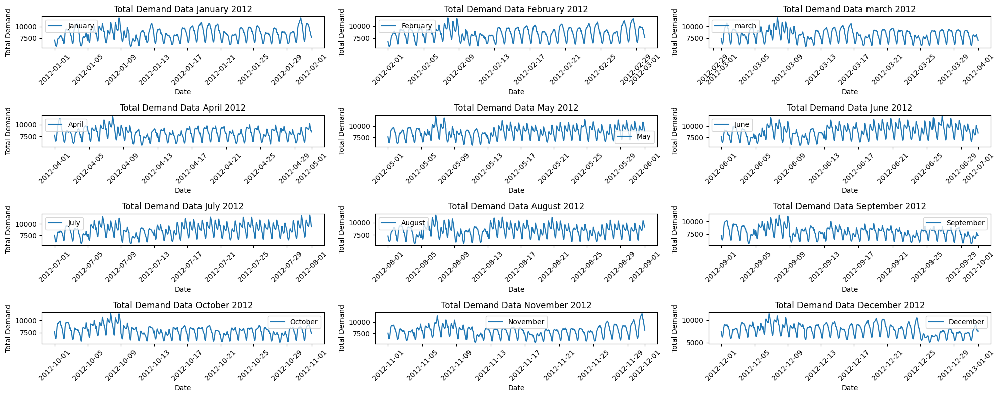

In [64]:

# Data filter only for 2012
data_2012 = demand_clean[demand_clean['DATETIME'].dt.year == 2012]

# Separate data by month
january_data = data_2012[data_2012['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2012[data_2012['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2012[data_2012['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2012[data_2012['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2012[data_2012['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2012[data_2012['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2012[data_2012['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2012[data_2012['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2012[data_2012['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2012[data_2012['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2012[data_2012['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2012[data_2012['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2012')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2012')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2012')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2012')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2012')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

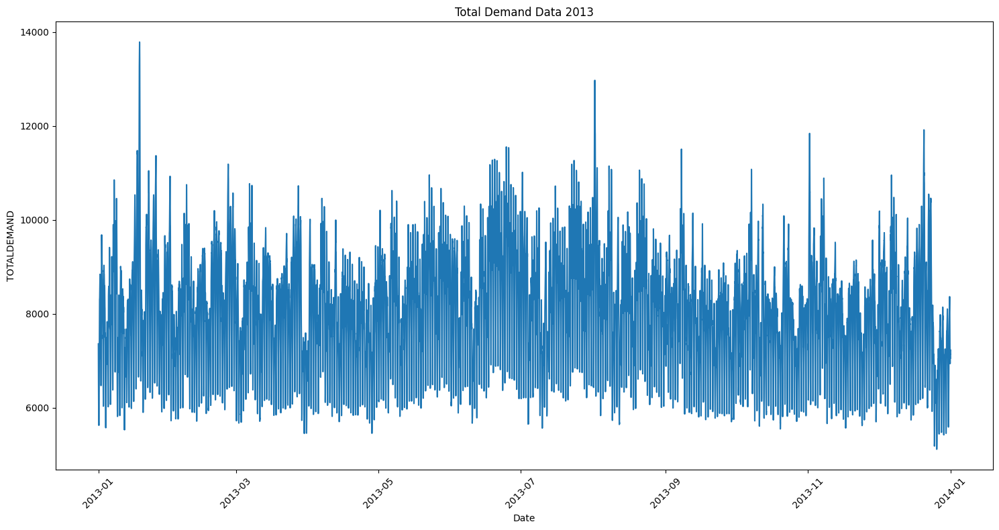

In [65]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2013
data_2013 = demand_clean[(demand_clean['DATETIME'].dt.year == 2013)]
data_2013 = data_2013.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2013['DATETIME'], data_2013['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2013')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


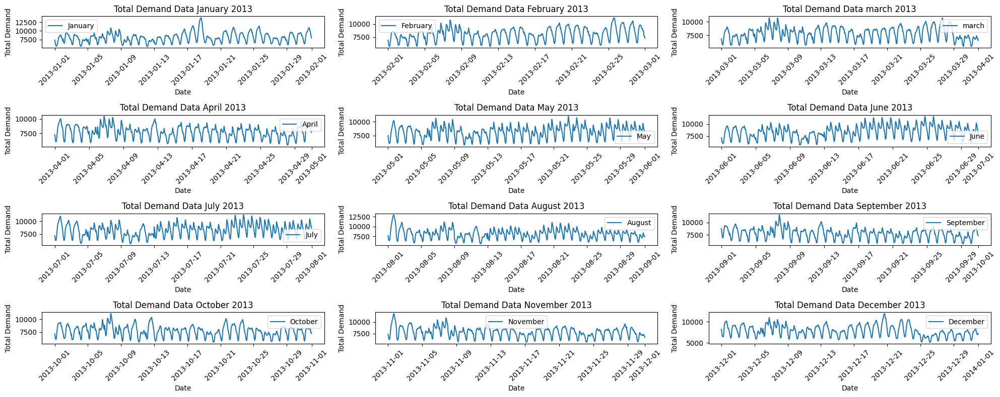

In [66]:

# Data filter only for 2013
data_2013 = demand_clean[demand_clean['DATETIME'].dt.year == 2013]

# Separate data by month
january_data = data_2013[data_2013['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2013[data_2013['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2013[data_2013['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2013[data_2013['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2013[data_2013['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2013[data_2013['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2013[data_2013['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2013[data_2013['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2013[data_2013['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2013[data_2013['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2013[data_2013['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2013[data_2013['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2013')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2013')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2013')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2013')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2013')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

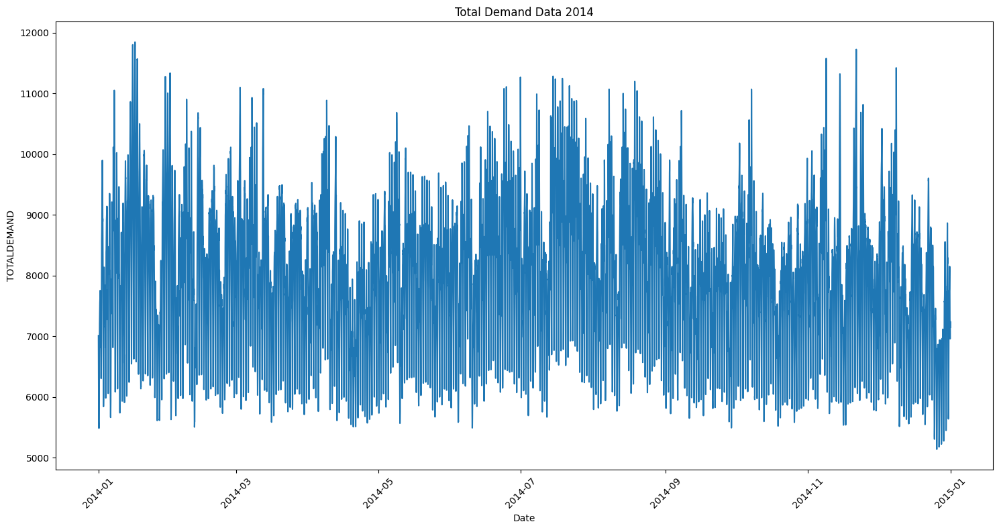

In [67]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2014
data_2014 = demand_clean[(demand_clean['DATETIME'].dt.year == 2014)]
data_2014 = data_2014.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2014['DATETIME'], data_2014['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2014')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()

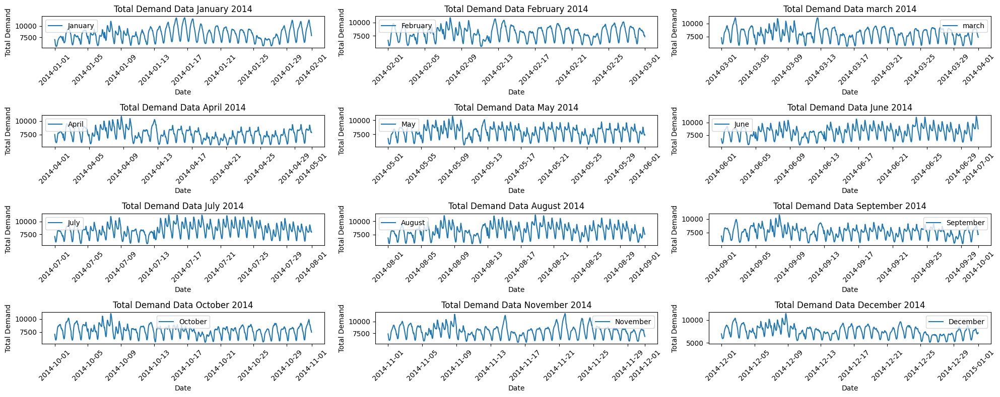

In [68]:
# Data filter only for 2014
data_2014 = demand_clean[demand_clean['DATETIME'].dt.year == 2014]

# Separate data by month
january_data = data_2014[data_2014['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2014[data_2014['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2014[data_2014['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2014[data_2014['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2014[data_2014['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2014[data_2014['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2014[data_2014['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2014[data_2014['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2014[data_2014['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2014[data_2014['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2014[data_2014['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2014[data_2014['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2014')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2014')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2014')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2014')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2014')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

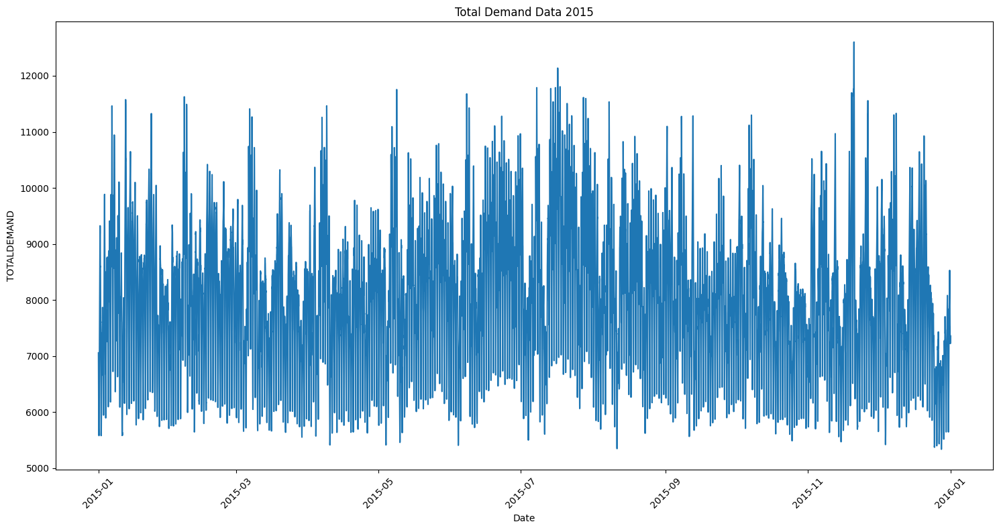

In [69]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2015
data_2015 = demand_clean[(demand_clean['DATETIME'].dt.year == 2015)]
data_2015 = data_2015.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2015['DATETIME'], data_2015['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2015')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


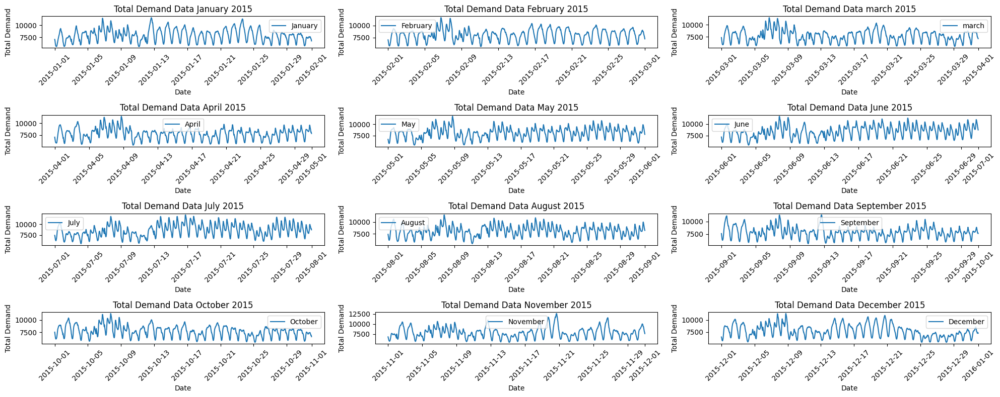

In [70]:

# Data filter only for 2015
data_2015 = demand_clean[demand_clean['DATETIME'].dt.year == 2015]

# Separate data by month
january_data = data_2015[data_2015['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2015[data_2015['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2015[data_2015['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2015[data_2015['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2015[data_2015['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2015[data_2015['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2015[data_2015['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2015[data_2015['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2015[data_2015['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2015[data_2015['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2015[data_2015['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2015[data_2015['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2015')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2015')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2015')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2015')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2015')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

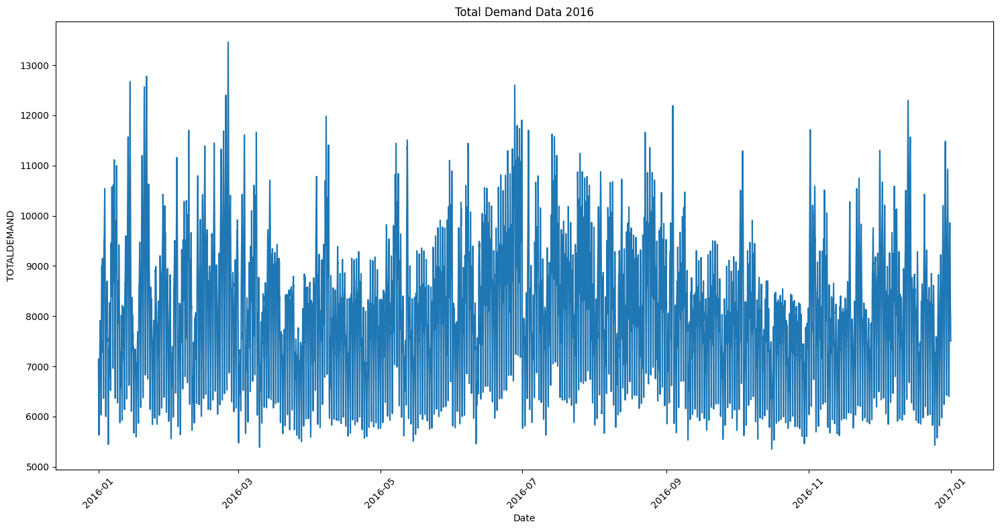

In [71]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2016
data_2016 = demand_clean[(demand_clean['DATETIME'].dt.year == 2016)]
data_2016 = data_2016.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2016['DATETIME'], data_2016['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2016')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


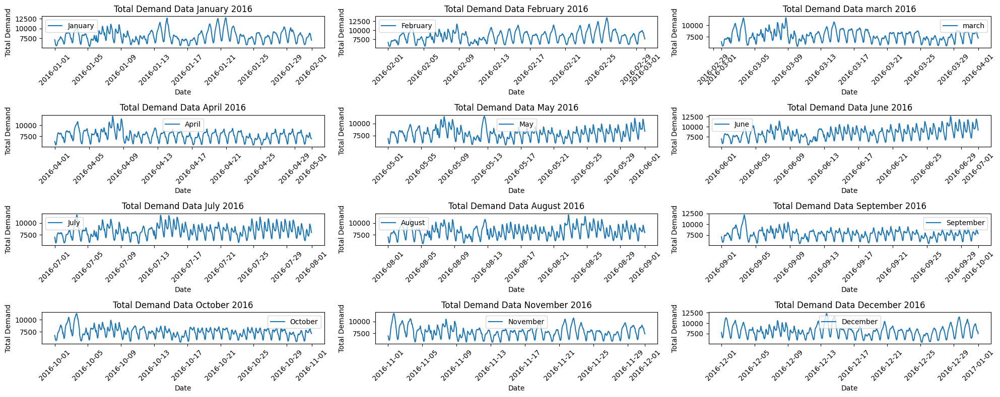

In [72]:

# Data filter only for 2016
data_2016 = demand_clean[demand_clean['DATETIME'].dt.year == 2016]

# Separate data by month
january_data = data_2016[data_2016['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2016[data_2016['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2016[data_2016['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2016[data_2016['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2016[data_2016['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2016[data_2016['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2016[data_2016['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2016[data_2016['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2016[data_2016['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2016[data_2016['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2016[data_2016['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2016[data_2016['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2016')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2016')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2016')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2016')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2016')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

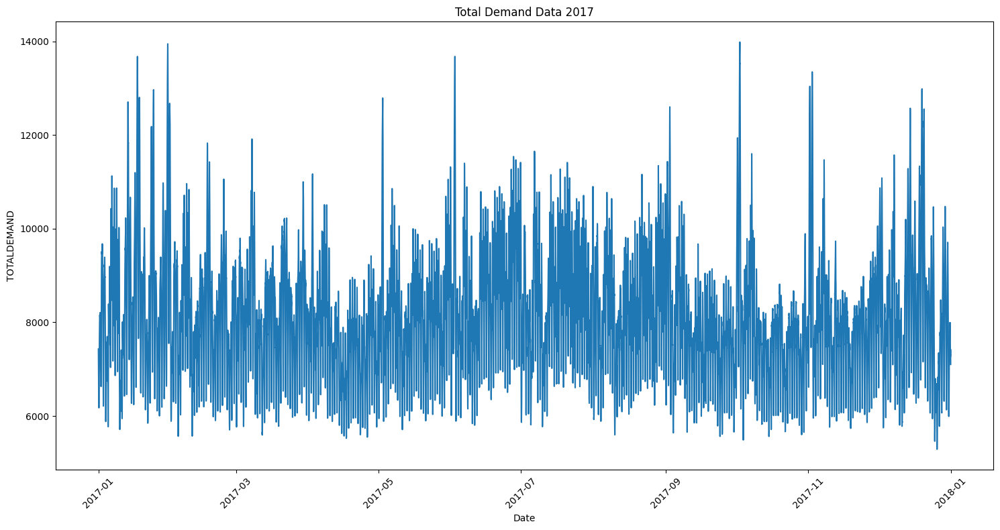

In [73]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2017
data_2017 = demand_clean[(demand_clean['DATETIME'].dt.year == 2017)]
data_2017 = data_2017.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2017['DATETIME'], data_2017['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2017')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()

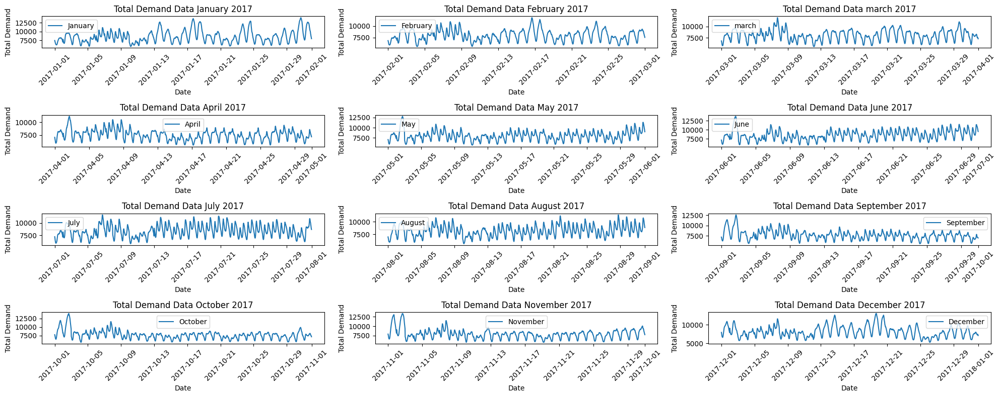

In [74]:


# Data filter only for 2017
data_2017 = demand_clean[demand_clean['DATETIME'].dt.year == 2017]

# Separate data by month
january_data = data_2017[data_2017['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2017[data_2017['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2017[data_2017['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2017[data_2017['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2017[data_2017['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2017[data_2017['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2017[data_2017['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2017[data_2017['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2017[data_2017['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2017[data_2017['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2017[data_2017['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2017[data_2017['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2017')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2017')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2017')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2017')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2017')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

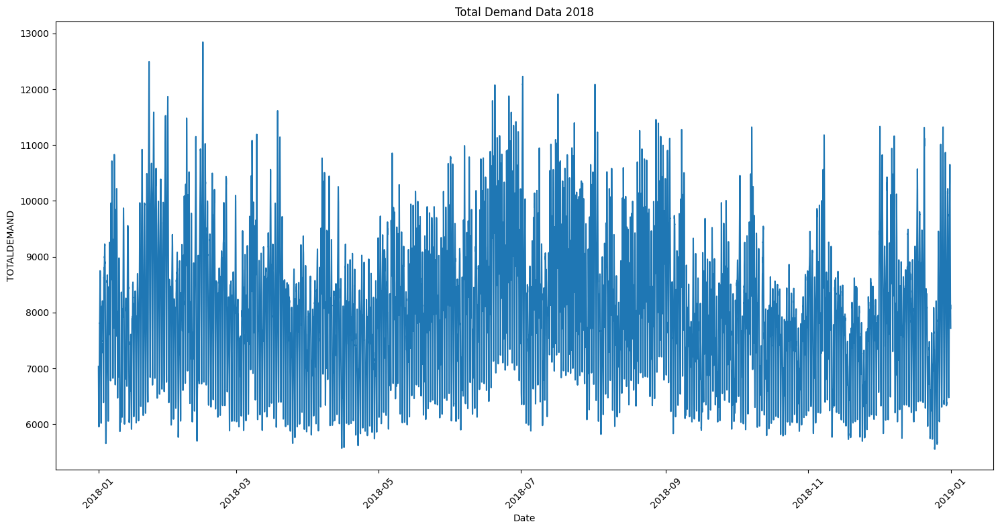

In [75]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2018
data_2018 = demand_clean[(demand_clean['DATETIME'].dt.year == 2018)]
data_2018 = data_2018.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2018['DATETIME'], data_2018['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2018')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


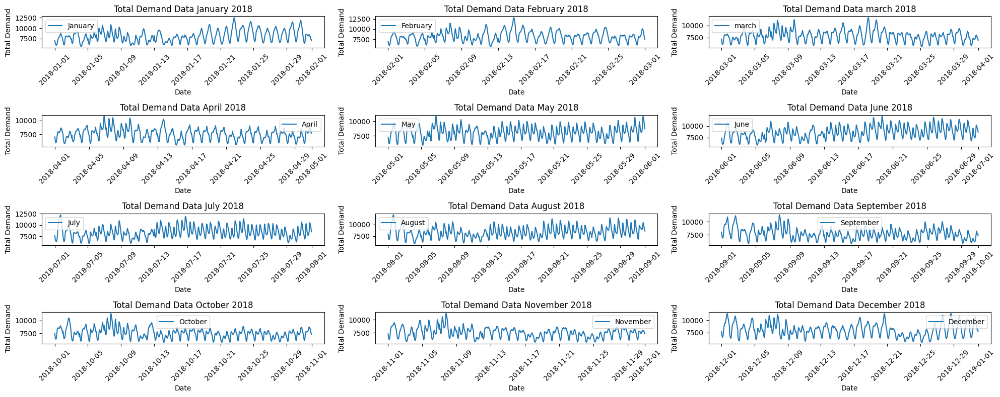

In [76]:

# Data filter only for 2018
data_2018 = demand_clean[demand_clean['DATETIME'].dt.year == 2018]

# Separate data by month
january_data = data_2018[data_2018['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2018[data_2018['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2018[data_2018['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2018[data_2018['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2018[data_2018['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2018[data_2018['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2018[data_2018['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2018[data_2018['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2018[data_2018['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2018[data_2018['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2018[data_2018['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2018[data_2018['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2018')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2018')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2018')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2018')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2018')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

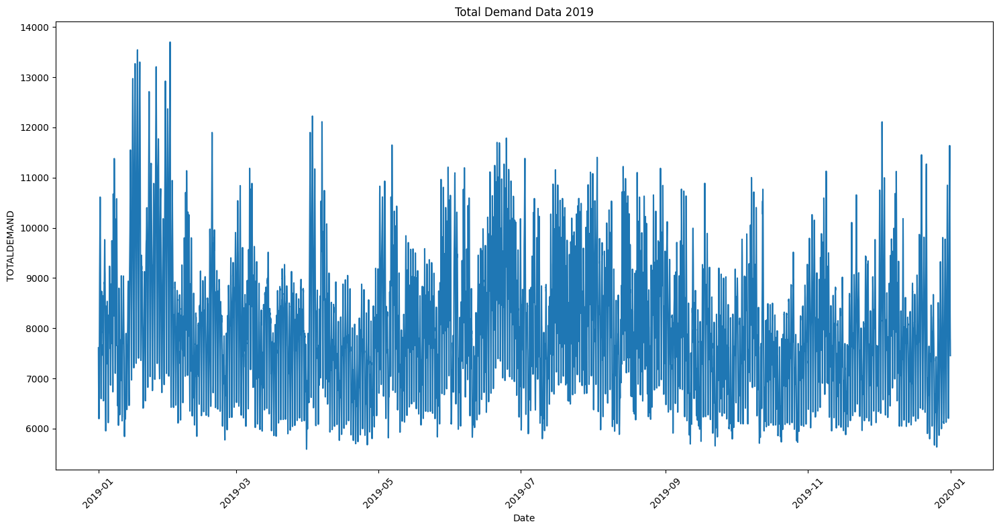

In [77]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2019
data_2019 = demand_clean[(demand_clean['DATETIME'].dt.year == 2019)]
data_2019 = data_2019.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2019['DATETIME'], data_2019['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2019')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


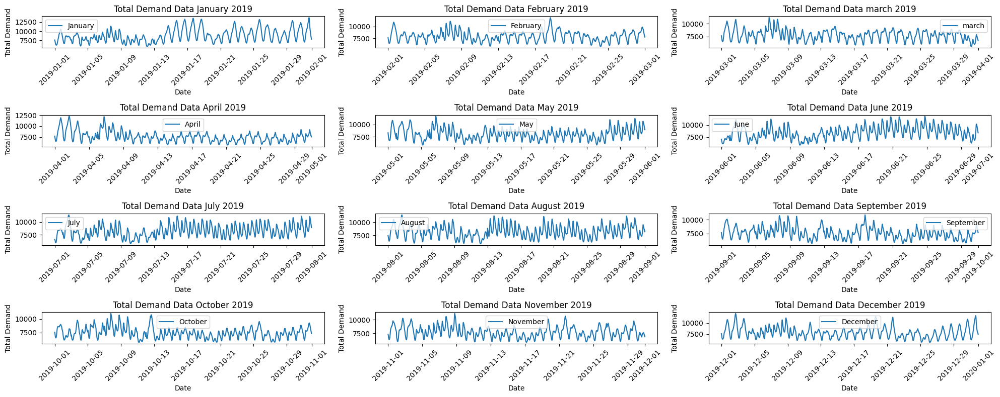

In [78]:

# Data filter only for 2019
data_2019 = demand_clean[demand_clean['DATETIME'].dt.year == 2019]

# Separate data by month
january_data = data_2019[data_2019['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2019[data_2019['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2019[data_2019['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2019[data_2019['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2019[data_2019['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2019[data_2019['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2019[data_2019['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2019[data_2019['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2019[data_2019['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2019[data_2019['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2019[data_2019['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2019[data_2019['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2019')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2019')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2019')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2019')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2019')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

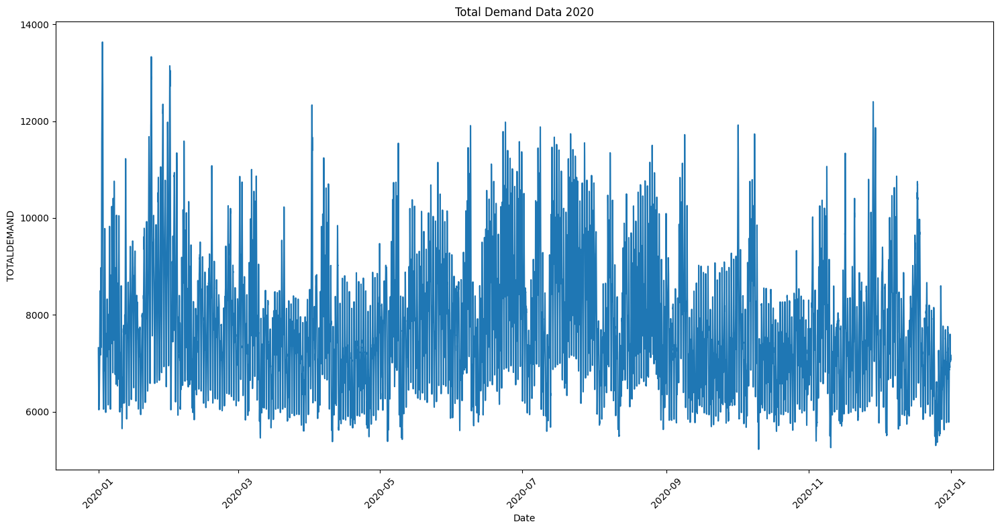

In [79]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2020
data_2020 = demand_clean[(demand_clean['DATETIME'].dt.year == 2020)]
data_2020 = data_2020.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2020['DATETIME'], data_2020['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2020')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


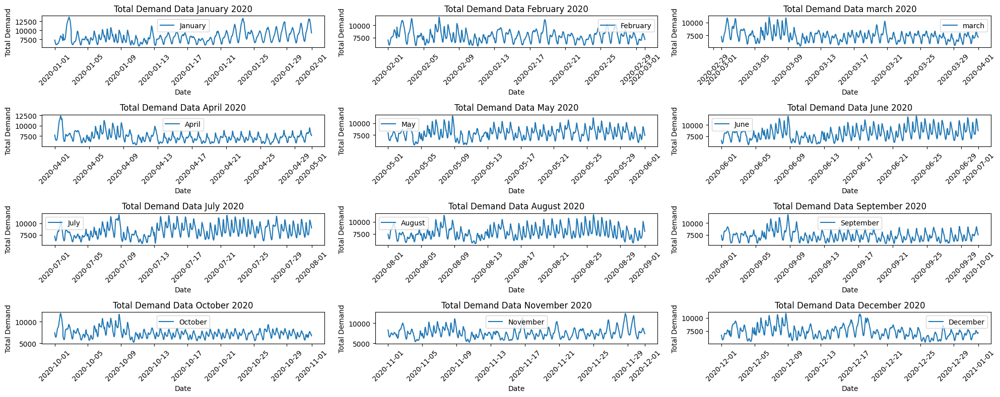

In [80]:

# Data filter only for 2020
data_2020 = demand_clean[demand_clean['DATETIME'].dt.year == 2020]

# Separate data by month
january_data = data_2020[data_2020['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2020[data_2020['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2020[data_2020['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2020[data_2020['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2020[data_2020['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2020[data_2020['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2020[data_2020['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2020[data_2020['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2020[data_2020['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2020[data_2020['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2020[data_2020['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2020[data_2020['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2020')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2020')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2020')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2020')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2020')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

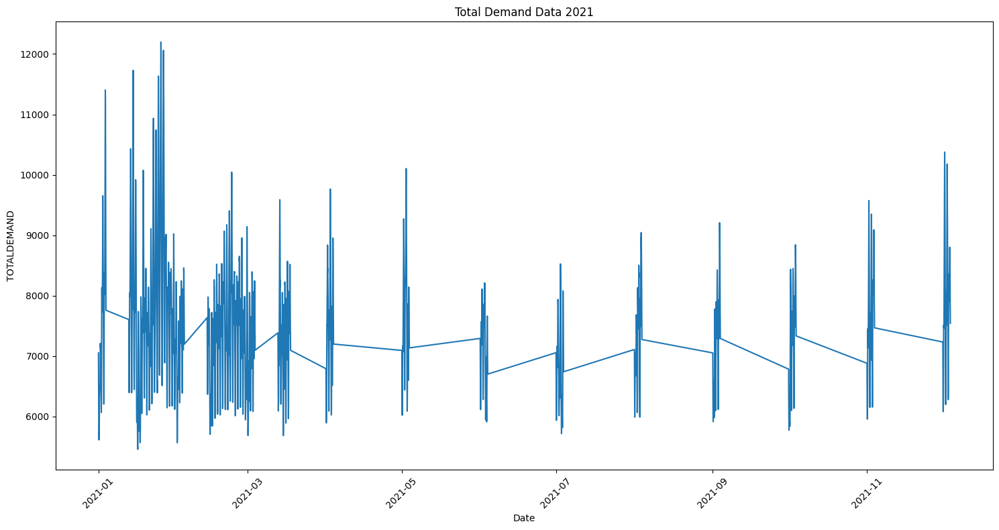

In [81]:
# Convert DATETIME column to datetime type
demand_clean['DATETIME'] = pd.to_datetime(demand_clean['DATETIME'], format='%Y-%m-%d %H:%M:%S')

# Data filter only for  January 2021
data_2021 = demand_clean[(demand_clean['DATETIME'].dt.year == 2021)]
data_2021 = data_2021.sort_values(by='DATETIME')

# Plot time series
plt.figure(figsize=(15, 8))
plt.plot(data_2021['DATETIME'], data_2021['TOTALDEMAND'])
plt.xlabel('Date')
plt.ylabel('TOTALDEMAND')
plt.title('Total Demand Data 2021')
plt.xticks(rotation=45)

#plt.grid(True)
plt.tight_layout()
plt.show()


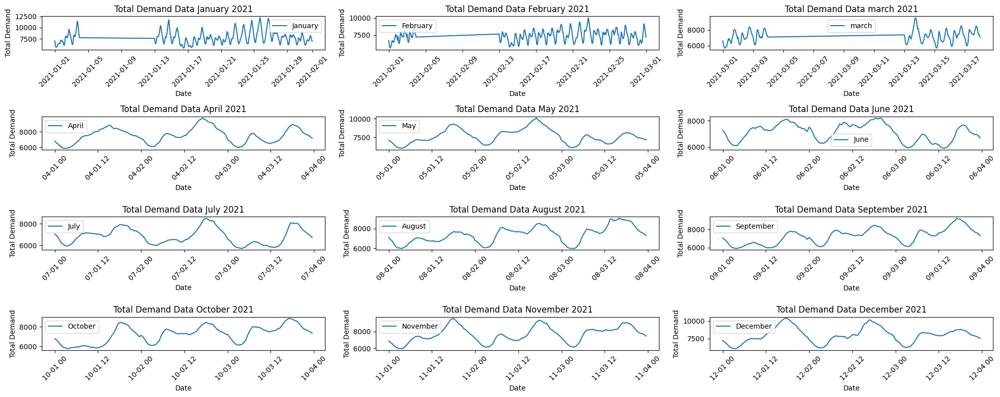

In [82]:

# Data filter only for 2021
data_2021 = demand_clean[demand_clean['DATETIME'].dt.year == 2021]

# Separate data by month
january_data = data_2021[data_2021['DATETIME'].dt.month == 1]
january_data = january_data.sort_values(by='DATETIME')
february_data = data_2021[data_2021['DATETIME'].dt.month == 2]
february_data = february_data.sort_values(by='DATETIME')
march_data = data_2021[data_2021['DATETIME'].dt.month == 3]
march_data = march_data.sort_values(by='DATETIME')
april_data = data_2021[data_2021['DATETIME'].dt.month == 4]
april_data = april_data.sort_values(by='DATETIME')
may_data = data_2021[data_2021['DATETIME'].dt.month == 5]
may_data = may_data.sort_values(by='DATETIME')
june_data = data_2021[data_2021['DATETIME'].dt.month == 6]
june_data = june_data.sort_values(by='DATETIME')
july_data = data_2021[data_2021['DATETIME'].dt.month == 7]
july_data = july_data.sort_values(by='DATETIME')
aug_data = data_2021[data_2021['DATETIME'].dt.month == 8]
aug_data = aug_data.sort_values(by='DATETIME')
sept_data = data_2021[data_2021['DATETIME'].dt.month == 9]
sept_data = sept_data.sort_values(by='DATETIME')
oct_data = data_2021[data_2021['DATETIME'].dt.month == 10]
oct_data = oct_data.sort_values(by='DATETIME')
nov_data = data_2021[data_2021['DATETIME'].dt.month == 11]
nov_data = nov_data.sort_values(by='DATETIME')
dec_data = data_2021[data_2021['DATETIME'].dt.month == 12]
dec_data = dec_data.sort_values(by='DATETIME')

# Create manual subplots
plt.figure(figsize=(20, 8))

# Plot January data
plt.subplot(4, 3, 1)  # 3 rows, 1 column, first subplot
plt.plot(january_data['DATETIME'], january_data['TOTALDEMAND'], label='January')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data January 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot February data
plt.subplot(4, 3, 2)  # 3 rows, 1 column, second subplot
plt.plot(february_data['DATETIME'], february_data['TOTALDEMAND'], label='February')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data February 2021')
plt.legend()
plt.xticks(rotation=45)

# March data plot
plt.subplot(4, 3, 3)  # 3 rows, 1 column, third subplot
plt.plot(march_data['DATETIME'], march_data['TOTALDEMAND'], label='march')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data march 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot April data
plt.subplot(4, 3, 4)
plt.plot(april_data['DATETIME'], april_data['TOTALDEMAND'], label='April')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data April 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot May data
plt.subplot(4, 3, 5)  # 3 rows, 1 column, second subplot
plt.plot(may_data['DATETIME'], may_data['TOTALDEMAND'], label='May')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data May 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot June data
plt.subplot(4, 3, 6)  # 3 rows, 1 column, third subplot
plt.plot(june_data['DATETIME'], june_data['TOTALDEMAND'], label='June')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data June 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot July data
plt.subplot(4, 3, 7)  # 3 rows, 1 column, first subplot
plt.plot(july_data['DATETIME'], july_data['TOTALDEMAND'], label='July')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data July 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot August data
plt.subplot(4, 3, 8)  # 3 rows, 1 column, second subplot
plt.plot(aug_data['DATETIME'], aug_data['TOTALDEMAND'], label='August')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data August 2021')
plt.legend()
plt.xticks(rotation=45)

# September data plot
plt.subplot(4, 3, 9)  # 3 rows, 1 column, third subplot
plt.plot(sept_data['DATETIME'], sept_data['TOTALDEMAND'], label='September')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data September 2021')
plt.legend()
plt.xticks(rotation=45)

# October data plot
plt.subplot(4, 3, 10)
plt.plot(oct_data['DATETIME'], oct_data['TOTALDEMAND'], label='October')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data October 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot November data
plt.subplot(4, 3, 11)  # 3 rows, 1 column, second subplot
plt.plot(nov_data['DATETIME'], nov_data['TOTALDEMAND'], label='November')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data November 2021')
plt.legend()
plt.xticks(rotation=45)

# Plot December data
plt.subplot(4, 3, 12)  # 3 rows, 1 column, third subplot
plt.plot(dec_data['DATETIME'], dec_data['TOTALDEMAND'], label='December')#, marker='o')
plt.xlabel('Date')
plt.ylabel('Total Demand')
plt.title('Total Demand Data December 2021')
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [83]:
# Merge both DataFrames based on key column 'key'
data_fix = pd.merge(temp_clean, demand_clean, on='DATETIME', how='inner')
data_fix = data_fix.drop(columns=['LOCATION','REGIONID'])
data_fix

,DATETIME,TEMPERATURE,TOTALDEMAND
0,2010-01-01 00:00:00,23.1,8038.00
1,2010-01-01 00:30:00,22.9,7809.31
2,2010-01-01 01:00:00,22.6,7483.69
3,2010-01-01 01:30:00,22.5,7117.23
4,2010-01-01 02:00:00,22.5,6812.03
...,...,...,...
195929,2021-03-17 22:00:00,19.7,7419.77
195930,2021-03-17 22:30:00,19.5,7417.91
195931,2021-03-17 23:00:00,19.1,7287.32
195932,2021-03-17 23:30:00,18.8,7172.39


## ACF and PACF Temperature

<Figure size 1000x600 with 0 Axes>

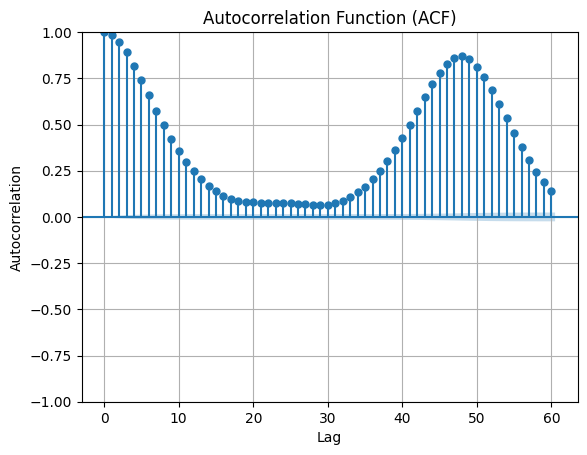

In [84]:
# ACF plot
plt.figure(figsize=(10, 6))
plot_acf(data_fix['TOTALDEMAND'], lags=60)  # Change the number of lags as needed
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

<Figure size 1000x600 with 0 Axes>

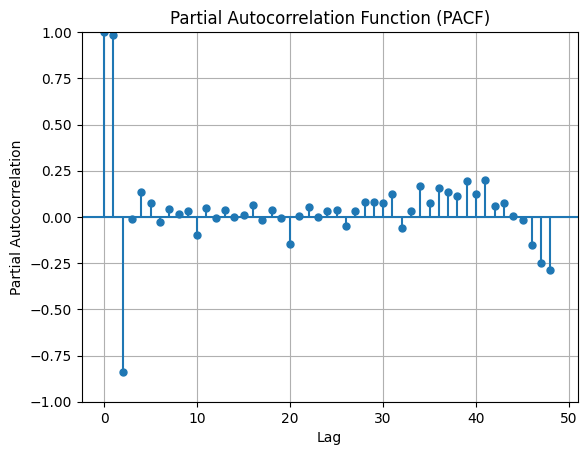

In [85]:
# PACF Plot
plt.figure(figsize=(10, 6))
plot_pacf(data_fix['TOTALDEMAND'], lags=48)  #
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.grid(True)
plt.show()


### Data Split




In [86]:
train_data = data_fix.iloc[:int(0.8*len(data_fix))]
test_data = data_fix.iloc[int(0.8*len(data_fix)):]
test_data

,DATETIME,TEMPERATURE,TOTALDEMAND
156747,2018-12-22 13:30:00,19.7,6716.33
156748,2018-12-22 14:00:00,19.7,6722.00
156749,2018-12-22 14:30:00,20.0,6714.45
156750,2018-12-22 15:00:00,20.2,6769.31
156751,2018-12-22 15:30:00,20.7,6846.47
...,...,...,...
195929,2021-03-17 22:00:00,19.7,7419.77
195930,2021-03-17 22:30:00,19.5,7417.91
195931,2021-03-17 23:00:00,19.1,7287.32
195932,2021-03-17 23:30:00,18.8,7172.39



## ARIMA Modeling

In [87]:
!pip3 install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.7 MB/s eta 0:00:00


In [88]:
import pmdarima as pm

Fit the seasonal ARIMA model using auto_arima

In [89]:
model_ARIMA = pm.auto_arima(train_data['TOTALDEMAND'], X=train_data.drop(columns=['DATETIME','TOTALDEMAND']),error_action='ignore', trace=True,
                      suppress_warnings=True, maxiter=500,test='adf')

Performing stepwise search to minimize aic


KeyboardInterrupt: 

Print out summary information on the fit

In [ ]:
print(model_ARIMA.summary())
print(model_ARIMA.params())

Summarize the model

In [ ]:
print(model_ARIMA.summary())


Obtained by using auto arima, the optimal AIC is in Model AR 2 (2,0,0). This model produces each coefficient as significant, indicated by a P-Value smaller than alpha (0.05). However, the assumptions of ARIMA in this model, including Non-Autocorrelation, Normality, and Homoscedasticity are not met.
If written in this model equation it becomes
Yhat = 220.43 - 2.17(Temperature) + 1.81(Phi1) - 0.83(Phi2) + 1.459e+04
#### Evaluation of the ARIMA Model with MAPE MSE, and RMSE


In [ ]:
predictions=model_ARIMA.predict(n_periods=len(test_data), X=test_data.drop(columns=['DATETIME','TOTALDEMAND']), alpha=0.05)

In [ ]:
mape=mean_absolute_percentage_error(test_data['TOTALDEMAND'], predictions)*100
print("Mean Absolute Percentage Error : %.2f%%"  % (mape))

rint('MAPE Test (3 Layer): %.2f%%' % (mape_test_bigru3layer))

In [ ]:
mse=mean_squared_error(test_data['TOTALDEMAND'], predictions)
print("Mean Squared Error : %.2f" % (mse))

In [ ]:
print("Root Mean Squared Error : %.2f"% ((mse)**0.5))

In [ ]:
prediction=pd.DataFrame(predictions)
prediction=prediction.reset_index()
prediction=prediction.drop(columns='index')
prediction

In [ ]:

output=pd.DataFrame()
output['Data Actual (Testing)']=test_data['TOTALDEMAND']
output['Prediction']=prediction[0]
output['Difference/Error']=output['Data Actual (Testing)']-output['Prediction']
output['% Change']=abs(output['Difference/Error']/output['Data Actual (Testing)'])*100
output['% Change'] = output['% Change'].apply(lambda x: f'{x:.2f}%')
output = output.round(2)
output

## XGBoost

In [90]:
X_train = train_data.loc[:,'TEMPERATURE']
y_train = train_data.loc[:,'TOTALDEMAND']

X_test = test_data.loc[:,'TEMPERATURE']
y_test = test_data.loc[:,'TOTALDEMAND']

In [113]:
# set up model use grid search CV for starting place
search_params = {'max_depth': [4, 5, 6, 8], 'n_estimators':[4000], 'learning_rate': [0.01, 0.05]}

# Create 5, 1 year splits
splits = TimeSeriesSplit(n_splits=3, test_size=30*2*24*30)

xgb_model = xgb.XGBRegressor(n_jobs=multiprocessing.cpu_count()//2,
                             objective='reg:squarederror',
                             early_stopping_rounds=50,
                             booster='gbtree')
grid_reg_max = GridSearchCV(estimator=xgb_model,
                            param_grid=search_params,
                            cv=splits.split(X_train, y_train),
                            n_jobs=2,
                            verbose=1)
grid_reg_max.fit(X_train, y_train, eval_set=[(X_train, y_train)], verbose=100)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[0]	validation_0-rmse:1289.99628
[100]	validation_0-rmse:1200.64275
[200]	validation_0-rmse:1200.48650
[300]	validation_0-rmse:1200.43461
[400]	validation_0-rmse:1200.41711
[500]	validation_0-rmse:1200.41036
[600]	validation_0-rmse:1200.40698
[700]	validation_0-rmse:1200.40530
[800]	validation_0-rmse:1200.40453
[900]	validation_0-rmse:1200.40411
[1000]	validation_0-rmse:1200.40389
[1100]	validation_0-rmse:1200.40376
[1200]	validation_0-rmse:1200.40369
[1300]	validation_0-rmse:1200.40366
[1400]	validation_0-rmse:1200.40364
[1500]	validation_0-rmse:1200.40364
[1600]	validation_0-rmse:1200.40363
[1700]	validation_0-rmse:1200.40363
[1800]	validation_0-rmse:1200.40363
[1900]	validation_0-rmse:1200.40363
[2000]	validation_0-rmse:1200.40363
[2100]	validation_0-rmse:1200.40363
[2200]	validation_0-rmse:1200.40363
[2228]	validation_0-rmse:1200.40363


GridSearchCV(cv=<generator object TimeSeriesSplit.split at 0x79a96b3ae420>,
             estimator=XGBRegressor(base_score=None, booster='gbtree',
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=50,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=1, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=2,
             param_grid={'learning_rate': [0.01, 0.05],
                         'max_depth': [4, 5, 6, 8], 'n_estimators': [4000]},
             verbose=1)

In [99]:
# Look at the error on the reserved set for comparison to the linear model
print(f'RMSE on test set: {np.sqrt(mean_squared_error(X_test, grid_reg_max.predict(X_test)))}')

RMSE on test set: 8216.614893084596


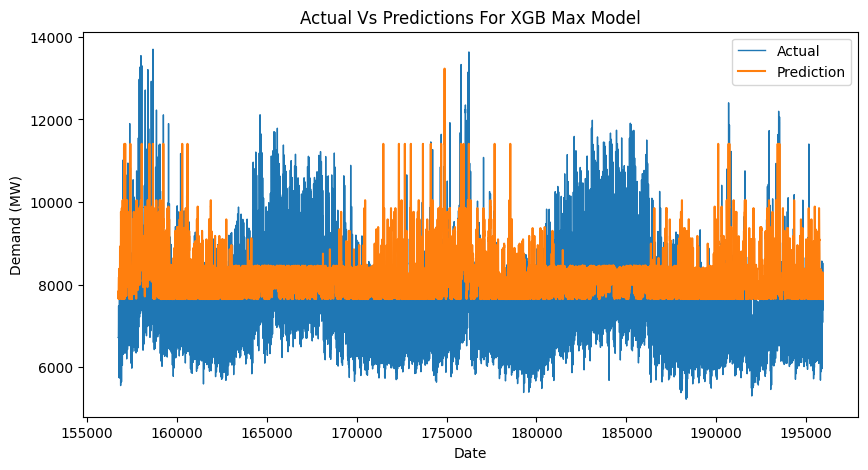

In [102]:
ax = y_test.plot(figsize=(10, 5), ms=1, lw=1, title='Actual Vs Predictions For XGB Max Model')
pd.DataFrame({'Predictions':grid_reg_max.predict(X_test)}, index=y_test.index).plot(ax=ax)
plt.ylabel('Demand (MW)')
plt.xlabel('Date')
plt.legend(['Actual', 'Prediction'])
plt.savefig('/content/drive/MyDrive/NSW_IMAGE/xgb-max-actualvpred.png')

## LSTM

In [ ]:
X_train = train_data.loc[:,['TEMPERATURE', 'TOTALDEMAND']]
y_train = train_data.loc[:,'TOTALDEMAND']

X_test = test_data.loc[:,['TEMPERATURE', 'TOTALDEMAND']]
y_test = test_data.loc[:,'TOTALDEMAND']

In [ ]:
scaler = StandardScaler()

train_data = train_data.values.reshape(len(train_data.values),2)
scaled_train = scaler.fit_transform(train_data)


In [ ]:
test_data = test_data.values.reshape(len(test_data.values),2)
scaled_test = scaler.transform(test_data)

In [ ]:
scaled_test[:,1]

In [ ]:
look_back = 10080 #lag predictor: to predict next 30 minute data, look at 30*2*24*7*4*3 minutes before
train_gen = TimeseriesGenerator(data=scaled_train, targets=scaled_train[:,1], length=look_back, batch_size=128)
test_gen = TimeseriesGenerator(data=scaled_test, targets=scaled_test[:,1], length=look_back, batch_size=1)

In [ ]:
# from tensorflow import keras
# def init_model_lstm():
#     # define architecture
#     model = keras.models.Sequential()
#     model.add(keras.layers.Bidirectional(keras.layers.LSTM( units = 256, activation = "tanh", return_sequences = False),input_shape = [look_back, 2]))
#     model.add(keras.layers.Dense(units = 32, activation = "relu"))
#     model.add(keras.layers.Dense(units=1))

#     # model compile

#     model.compile(optimizer='adam', loss='mean_squared_error')

#     return model

# model_lstm = init_model_lstm()
# model_lstm.summary()

In [ ]:
from tensorflow import keras
def init_model_lstm():
    # define architecture
    model = keras.models.Sequential()
    model.add(keras.layers.LSTM( units = 256, activation = "tanh", return_sequences = False,input_shape = [look_back, 2]))
    model.add(keras.layers.Dense(units = 32, activation = "relu"))
    model.add(keras.layers.Dense(units=1))

    # model compile

    model.compile(optimizer='adam', loss='mean_squared_error')

    return model

model_lstm = init_model_lstm()
model_lstm.summary()

In [ ]:
model_lstm.fit(train_gen, epochs=2)

Visualize the loss per epoch using `matplotlib`:

In [ ]:
plt.plot(model_lstm.history.history['loss'], marker='o')
plt.show()

Evaluate the mode

We can evaluate the model performance on train and test data, but remember, we are fitting the model with scaled data. So we have to **inverse transform** the prediction result in order to get the original range of data.

In [ ]:
train_loss = model_lstm.evaluate(train_gen)
test_loss = model_lstm.evaluate(test_gen)
print("TRAIN LOSS:", train_loss)
print("TEST LOSS:", test_loss)

In [ ]:
model_lstm.save('/content/drive/MyDrive/NSW_FORECASTING')

In [ ]:
train_predict = model_lstm.predict(train_gen)
test_predict = model_lstm.predict(test_gen)

In [ ]:
# visualization
plt.plot(x, label="Actual Data", color="black")
plt.plot(range(look_back, len(train)), train_predict, label="Predicted (Train)", color="blue")
plt.plot(range(look_back+len(train), len(x)), test_predict, label="Predicted (Test)", color="yellow")
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.show()

In [ ]:
scaled_train_predict = model_lstm.predict(train_gen)

In [ ]:
scaled_train_predict

In [ ]:
train_predict = scaler.inverse_transform(scaled_train_predict)
train_predict.shape

In [ ]:
# your code here
scaled_test_predict = model_lstm.predict(test_gen)
test_predict = scaler.inverse_transform(scaled_test_predict)

Now, let's visualize the prediction vs actual result and calculate the root mean squared error (RMSE).

In [ ]:
# create numpy array containing nan
temp = np.empty((df_train.shape[0], 1))
temp[:] = np.nan

# fill the array with train_predict
temp[-len(train_predict):] = train_predict

df_train["prediction"] = temp

# visualize
df_train.plot(figsize=(14, 7))